### 🔍 3D 밀도 필드 비교 시각화 (True vs Base vs UNet vs ViT)

이 셀은 동일한 위치의 3D 밀도 필드 ρ(x,y,z)에 대해  
**True (시뮬레이션 정답)**, **Base baseline**, **UNet**, **ViT** 예측을  
**동일한 스케일에서 직접 비교**하기 위한 시각화입니다.

#### ✅ 처리 흐름
1. HDF5/NPY에서 데이터를 불러옵니다.
2. 입력 형태가 `(N,C,D,H,W)` 또는 `(H,W,D)`일 수 있으므로  
   → 모두 `(D,H,W)` 형태로 정규화합니다.
3. Base 결과는 학습 시 `log10(ρ)/2.5`였으므로  
   → `10**(2.5*x)` 로 **ρ** 로 복원합니다.
4. Z축(D)을 기준으로 평균 투영하여 `(H,W)` 2D 맵으로 변환합니다.
5. 대비를 보기 쉽게 `log1p(ρ)` 변환을 적용합니다.
6. 네 이미지 모두에서 **동일 퍼센타일 기반 색상 스케일(vmin/vmax)** 을 사용하여  
   → 공정 비교가 가능하도록 합니다.
7. 모든 subplot에 대해 **하나의 공통 colorbar** 를 사용합니다.

#### ⚠️ 주의할 점
- `to_DHW()`는 축 자동 추론을 사용하므로,  
  **데이터 포맷이 확정되어 있다면 명시적 transpose가 더 안전합니다.**
- base가 `(log10(1+δ))/2.5` 기반이라면  
  → 복원식이 `10**(2.5*x) - 1` 로 달라질 수 있습니다.
- 시각화만으로 판단하기 보다는  
  `corrcoef`, `MSE`, 차이맵 등을 함께 확인하는 것이 좋습니다.



  true | shape=(128, 128, 128)  min=0.0394  max=378  mean=1
  base | shape=(128, 128, 128)  min=0.0813  max=88.4  mean=0.784
  unet | shape=(128, 128, 128)  min=0  max=188  mean=1
   vit | shape=(128, 128, 128)  min=-0.14  max=231  mean=0.959
   gan | shape=(128, 128, 128)  min=-3.87  max=2.38  mean=-0.205


/tmp/ipykernel_3480290/3805065705.py:100: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap("cividis")
/tmp/ipykernel_3480290/3805065705.py:132: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


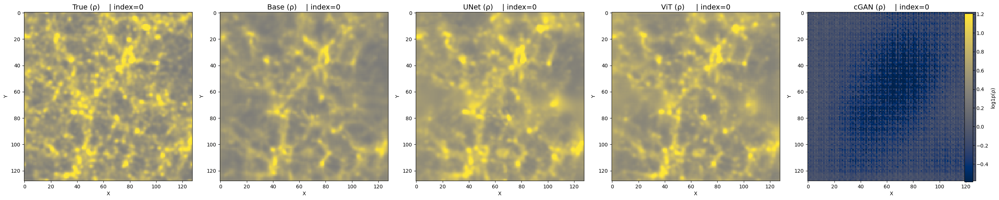

In [1]:
import numpy as np
import h5py
import matplotlib.pyplot as plt
import matplotlib.cm as cm  # [중요] cmap/mappable용
from typing import Tuple

def to_DHW(a: np.ndarray) -> np.ndarray:
    """
    입력 배열을 (D,H,W)로 표준화.
    허용 형태: (D,H,W), (H,W,D), (C,D,H,W), (N,C,D,H,W), (N,D,H,W)
    주의: '가장 긴 축이 D'라는 휴리스틱을 사용하므로, 데이터 스펙을 알고 있으면
         명시적 transpose(예: a.transpose(2,0,1))가 더 안전합니다.
    """
    a = np.asarray(a)
    # 앞쪽의 길이 1인 축(N=1, C=1 등)을 최대 2회 제거
    while a.ndim > 3 and a.shape[0] == 1:
        a = a[0]
    while a.ndim > 3 and a.shape[0] == 1:
        a = a[0]

    if a.ndim == 5:          # (N,C,D,H,W) -> 첫 샘플, 첫 채널 선택
        a = a[0, 0]
    elif a.ndim == 4:        # (N,D,H,W) or (C,D,H,W)
        a = a[0]
    elif a.ndim != 3:
        raise ValueError(f"Unsupported shape: {a.shape}")

    # (H,W,D) 케이스 추정: 최댓값인 축이 마지막이면 (2,0,1)로 transpose
    # (데이터 사양을 알면 여기를 고정 transpose로 바꾸세요.)
    if a.shape[2] == max(a.shape) and a.shape[0] != max(a.shape):
        a = a.transpose(2, 0, 1)  # (H,W,D) -> (D,H,W)

    return a  # (D,H,W) 가정

# ----------------- 사용자 설정 -----------------
index = '0'  # 문자열/정수 모두 가능(파일명에 맞춤)
base_path = "/gpfs/adupuy/cosmicweb_asim/ASIM_TSC/samples/predictions/"
unet_pred_path = "/home/mingyeong/GAL2DM_ASIM_VNET/results/unet_predictions/28845/icase-both-keep2"
vit_pred_path  = "/home/mingyeong/GAL2DM_ASIM_ViT/results/vit_predictions/28846/icase-both"
gan_pred_path  = "/home/mingyeong/GAL2DM_ASIM_GAN/results/cgan_predictions/35237/35205/icase-both"
true_test_path = f"/gpfs/adupuy/cosmicweb_asim/ASIM_TSC/samples/test/{index}.hdf5"
# ------------------------------------------------

# ---- 데이터 로드 ----
with h5py.File(true_test_path, 'r') as f:
    rho_true = f['output_rho'][:]      # 타깃: 실제 밀도 ρ

with h5py.File(f"{unet_pred_path}/{index}.hdf5", 'r') as f:
    rho_pred_unet = f['prediction'][:] # UNet 예측 (ρ로 학습했다면 추가 변환 불필요)

with h5py.File(f"{vit_pred_path}/{index}.hdf5", 'r') as f:
    rho_pred_vit = f['prediction'][:]  # ViT 예측

with h5py.File(f"{gan_pred_path}/{index}.hdf5", 'r') as f:
    rho_pred_gan = f['prediction'][:]  # cGAN 예측 (데이터셋 이름이 다르면 수정 필요)

# base_raw가 log10(ρ)/2.5 형식이라고 '가정' -> ρ로 역변환
base_raw = np.load(
    f"{base_path}test_{index}_final_mode0_lr_min1e-07_max1e-05_200epochs_rho_240712_a100_cmb_f2.5.npy"
)
rho_base = 10**(2.5 * base_raw)
# ⚠️ 만약 base가 log10(1+δ)/2.5였다면:
# rho_base = (10**(2.5 * base_raw) - 1) * rho_true.mean()

# ---- (D,H,W)로 표준화 ----
rho_true      = to_DHW(rho_true)
rho_pred_unet = to_DHW(rho_pred_unet)
rho_pred_vit  = to_DHW(rho_pred_vit)
rho_pred_gan  = to_DHW(rho_pred_gan)
rho_base      = to_DHW(rho_base)

# ---- 기본 통계/유효값 체크(빠른 sanity) ----
def stats(name, a):
    print(f"{name:>6s} | shape={a.shape}  "
          f"min={a.min():.3g}  max={a.max():.3g}  mean={a.mean():.3g}")

for n, a in [
    ("true", rho_true),
    ("base", rho_base),
    ("unet", rho_pred_unet),
    ("vit",  rho_pred_vit),
    ("gan",  rho_pred_gan),
]:
    stats(n, a)
    assert np.isfinite(a).all(), f"{n} contains NaN/Inf"

# ---- 투영(평균) + log1p(ρ) ----
proj = lambda x: x.mean(axis=0)  # (D,H,W)->(H,W). 단층(slice)을 보고 싶으면 x[D//2] 등 사용.
P_true = np.log1p(proj(rho_true))
P_base = np.log1p(proj(rho_base))
P_unet = np.log1p(proj(rho_pred_unet))
P_vit  = np.log1p(proj(rho_pred_vit))
P_gan  = np.log1p(proj(rho_pred_gan))

# ---- 공통 컬러스케일(norm) 계산 ----
imgs = [P_true, P_base, P_unet, P_vit, P_gan]
stack = np.concatenate([im.ravel() for im in imgs])
vmin, vmax = np.percentile(stack, [1, 99])  # 극단치 배제(필요 시 0.5–99.5 등 조정)

cmap = cm.get_cmap("cividis")
norm = plt.Normalize(vmin=vmin, vmax=vmax)  # [중요] 모든 패널에 공통 적용

# ---- 시각화 ----
fig, ax = plt.subplots(1, 5, figsize=(30, 6))
titles = [
    f"True (ρ)    | index={index}",
    f"Base (ρ)    | index={index}",
    f"UNet (ρ)    | index={index}",
    f"ViT (ρ)     | index={index}",
    f"cGAN (ρ)    | index={index}",
]

for i, im in enumerate(imgs):
    ax[i].imshow(im, cmap=cmap, norm=norm)
    ax[i].set_title(titles[i], fontsize=14)
    ax[i].set_xlabel("X")
    ax[i].set_ylabel("Y")

# 단일 mappable로 공통 colorbar 생성(개별 축에 종속되지 않게)
mappable = cm.ScalarMappable(norm=norm, cmap=cmap)
mappable.set_array([])

fig.colorbar(
    mappable,
    ax=ax.ravel().tolist(),
    fraction=0.02,
    pad=0.04,
    label="log1p(ρ)"
)

# 여백 조정(우측 colorbar 확보)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()


GAN file: /home/mingyeong/GAL2DM_ASIM_GAN/results/cgan_predictions/35237/35205/icase-both/0.hdf5
gan  | shape=(128, 128, 128)  min=-3.87  max=2.38  mean=-0.205


/tmp/ipykernel_3480290/2157218170.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap("cividis")


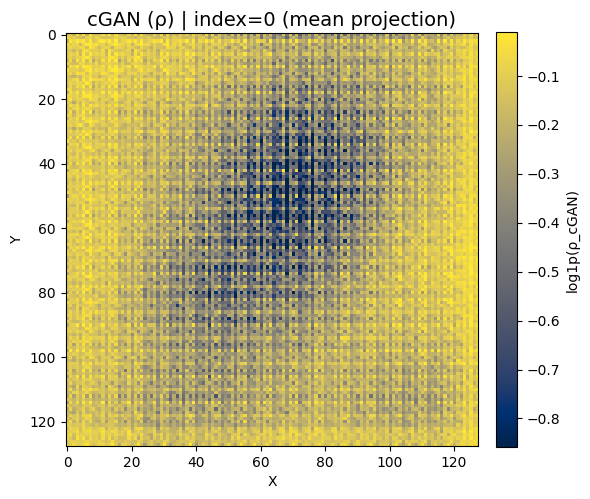

In [2]:
# ===== Cell: cGAN prediction only =====
import numpy as np
import h5py
import matplotlib.pyplot as plt
import matplotlib.cm as cm

def to_DHW(a: np.ndarray) -> np.ndarray:
    """
    입력 배열을 (D,H,W)로 표준화.
    허용 형태: (D,H,W), (H,W,D), (C,D,H,W), (N,C,D,H,W), (N,D,H,W)
    """
    a = np.asarray(a)
    while a.ndim > 3 and a.shape[0] == 1:
        a = a[0]
    while a.ndim > 3 and a.shape[0] == 1:
        a = a[0]

    if a.ndim == 5:      # (N,C,D,H,W)
        a = a[0, 0]
    elif a.ndim == 4:    # (N,D,H,W) or (C,D,H,W)
        a = a[0]
    elif a.ndim != 3:
        raise ValueError(f"Unsupported shape: {a.shape}")

    if a.shape[2] == max(a.shape) and a.shape[0] != max(a.shape):
        a = a.transpose(2, 0, 1)  # (H,W,D) -> (D,H,W)

    return a

# -------- 경로/인덱스 설정 --------
index = "0"
gan_pred_path = "/home/mingyeong/GAL2DM_ASIM_GAN/results/cgan_predictions/35237/35205/icase-both"

# --------- 데이터 로드 ---------
gan_file = f"{gan_pred_path}/{index}.hdf5"
print("GAN file:", gan_file)

with h5py.File(gan_file, "r") as f:
    # cGAN 결과 dataset 이름이 다르면 여기만 맞춰 수정
    rho_pred_gan = f["prediction"][:]

rho_pred_gan = to_DHW(rho_pred_gan)

print(
    f"gan  | shape={rho_pred_gan.shape}  "
    f"min={rho_pred_gan.min():.3g}  max={rho_pred_gan.max():.3g}  "
    f"mean={rho_pred_gan.mean():.3g}"
)

# --------- 투영 방식 선택 ---------
# 평균 투영 (D 방향 평균) 또는 중간 슬라이스 중 택 1
use_mid_slice = False  # True 로 바꾸면 단일 슬라이스 표시

if use_mid_slice:
    d_mid = rho_pred_gan.shape[0] // 2
    img_2d = rho_pred_gan[d_mid]
    title_suffix = f"(mid slice, z={d_mid})"
else:
    img_2d = rho_pred_gan.mean(axis=0)
    title_suffix = "(mean projection)"

# log1p 스케일 (필요 없으면 아래 줄을 주석 처리)
img_2d = np.log1p(img_2d)

# --------- 컬러스케일 & 플롯 ---------
vmin, vmax = np.percentile(img_2d, [1, 99])

cmap = cm.get_cmap("cividis")

fig, ax = plt.subplots(1, 1, figsize=(6, 6))
im = ax.imshow(img_2d, cmap=cmap, vmin=vmin, vmax=vmax)
ax.set_title(f"cGAN (ρ) | index={index} {title_suffix}", fontsize=14)
ax.set_xlabel("X")
ax.set_ylabel("Y")

cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label("log1p(ρ_cGAN)")

plt.tight_layout()
plt.show()


2025-11-12 13:42:44,806 | INFO | [true] /gpfs/adupuy/cosmicweb_asim/ASIM_TSC/samples/test/0.hdf5 :: 'output_rho'
2025-11-12 13:42:44,856 | INFO | [resolve] exact: /home/mingyeong/GAL2DM_ASIM_VNET/results/unet_predictions/28845/icase-both-keep2/0.hdf5
2025-11-12 13:42:44,857 | INFO | [resolve] exact: /home/mingyeong/GAL2DM_ASIM_ViT/results/vit_predictions/28846/icase-both/0.hdf5
2025-11-12 13:42:44,857 | INFO | [pred] /home/mingyeong/GAL2DM_ASIM_VNET/results/unet_predictions/28845/icase-both-keep2/0.hdf5 :: 'prediction'
2025-11-12 13:42:44,907 | INFO | [pred] /home/mingyeong/GAL2DM_ASIM_ViT/results/vit_predictions/28846/icase-both/0.hdf5 :: 'prediction'
2025-11-12 13:42:44,981 | INFO | [resolve] glob: /gpfs/adupuy/cosmicweb_asim/ASIM_TSC/samples/predictions/test_0_final_mode0_lr_min1e-07_max1e-05_200epochs_rho_240712_a100_cmb_f2.5.npy
2025-11-12 13:42:44,981 | INFO | [base] loading /gpfs/adupuy/cosmicweb_asim/ASIM_TSC/samples/predictions/test_0_final_mode0_lr_min1e-07_max1e-05_200epochs

/tmp/ipykernel_1581085/2726993108.py:122: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap("cividis"); norm = plt.Normalize(vmin=vmin, vmax=vmax)
/tmp/ipykernel_1581085/2726993108.py:139: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0,0,0.92,1]); plt.show()


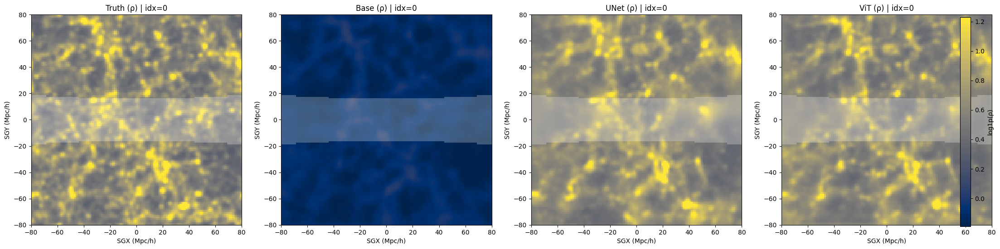

In [3]:
# -*- coding: utf-8 -*-
"""
Truth / Base / UNet / ViT 4-패널 ZOA(|b|<5°) 오버레이 플로터
- true_test_path: HDF5 ('output_rho')
- base_path: 디렉터리 내 *.npy (index 포함 파일) -> 변환 옵션으로 ρ 복원 가능
- unet_pred_path, vit_pred_path: HDF5 ('prediction')
"""

import os, glob, time, logging, pathlib
from typing import Optional, Tuple

import h5py
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from astropy.coordinates import SkyCoord, Supergalactic, CartesianRepresentation
import astropy.units as u

# -------------------- 사용자 설정 --------------------
index = '0'  # 문자열/정수 모두 가능(파일명에 맞춤)
base_path = "/gpfs/adupuy/cosmicweb_asim/ASIM_TSC/samples/predictions/"
unet_pred_path = "/home/mingyeong/GAL2DM_ASIM_VNET/results/unet_predictions/28845/icase-both-keep2"
vit_pred_path  = "/home/mingyeong/GAL2DM_ASIM_ViT/results/vit_predictions/28846/icase-both"
true_test_path = f"/gpfs/adupuy/cosmicweb_asim/ASIM_TSC/samples/test/{index}.hdf5"

VIEW_MODE = "proj"   # "proj"(깊이평균) | "slice"(중간단층)
L = 160.0            # 박스 길이 (Mpc/h 등)

# Base 변환 방식: None, "log10rho_over_2p5", "log10(1+delta)_over_2p5"
BASE_TRANSFORM = None   # 필요 시 "log10rho_over_2p5" 로 변경

# -------------------- 로깅 --------------------
logging.basicConfig(level=logging.INFO, format="%(asctime)s | %(levelname)s | %(message)s")
log = logging.getLogger("ZOA4")

# -------------------- 유틸 --------------------
def to_DHW(a: np.ndarray) -> np.ndarray:
    a = np.asarray(a)
    while a.ndim > 3 and a.shape[0] == 1: a = a[0]
    while a.ndim > 3 and a.shape[0] == 1: a = a[0]
    if a.ndim == 5: a = a[0, 0]
    elif a.ndim == 4: a = a[0]
    elif a.ndim != 3: raise ValueError(f"Unsupported shape: {a.shape}")
    if a.shape[2] == max(a.shape) and a.shape[0] != max(a.shape):
        a = a.transpose(2, 0, 1)
    return a  # (D,H,W)=(Z,Y,X)

def resolve_exact_or_glob(root: str, idx, exts=("hdf5","h5","npy")) -> str:
    idx_str = str(idx)
    cands = [os.path.join(root, f"{idx_str}.{e}") for e in exts]
    for p in cands:
        if os.path.isfile(p):
            log.info(f"[resolve] exact: {p}")
            return p
    patts = [os.path.join(root, f"*{idx_str}*.{e}") for e in exts]
    for pat in patts:
        found = sorted(glob.glob(pat))
        if found:
            log.info(f"[resolve] glob: {found[0]}")
            return found[0]
    raise FileNotFoundError(f"No file for index={idx} under {root}")

def load_true(h5_path: str, ds: str="output_rho") -> np.ndarray:
    log.info(f"[true] {h5_path} :: '{ds}'")
    with h5py.File(h5_path,'r') as f:
        arr = f[ds][:]
    return to_DHW(arr)

def load_pred_h5(h5_path: str, ds: str="prediction") -> np.ndarray:
    log.info(f"[pred] {h5_path} :: '{ds}'")
    with h5py.File(h5_path,'r') as f:
        arr = f[ds][:]
    return to_DHW(arr)

def load_base(base_dir: str, idx, transform: Optional[str], rho_true_for_delta: Optional[np.ndarray]=None) -> np.ndarray:
    npy_path = resolve_exact_or_glob(base_dir, idx, exts=("npy",))
    log.info(f"[base] loading {npy_path}")
    raw = np.load(npy_path)
    raw = to_DHW(raw)

    if transform is None:
        rho = raw
    elif transform == "log10rho_over_2p5":
        rho = 10.0 ** (2.5 * raw)
    elif transform == "log10(1+delta)_over_2p5":
        if rho_true_for_delta is None:
            raise ValueError("rho_true required for 'log10(1+delta)_over_2p5'")
        rho = (10.0 ** (2.5 * raw) - 1.0) * float(rho_true_for_delta.mean())
    else:
        raise ValueError(f"Unknown BASE_TRANSFORM: {transform}")
    return rho

# -------------------- 좌표/마스크 --------------------
def galactic_latitude_grid(N: int, L: float) -> np.ndarray:
    log.info(f"[b-grid] build N={N}, L={L}")
    axis = np.linspace(-L/2, L/2, N, dtype=np.float64)
    sgz, sgy, sgx = np.meshgrid(axis, axis, axis, indexing='ij')  # (Z,Y,X)
    rep = CartesianRepresentation(x=sgx.ravel()*u.Mpc, y=sgy.ravel()*u.Mpc, z=sgz.ravel()*u.Mpc)
    b = SkyCoord(rep, frame=Supergalactic()).galactic.b.radian.reshape((N,N,N))
    return b

def zoa_mask_xy(b3d: np.ndarray, mode: str="proj") -> np.ndarray:
    deg5 = np.radians(5.0)
    if mode == "proj":   # Z축 축소 → (H,W)
        return (np.abs(b3d) < deg5).any(axis=0)
    elif mode == "slice":
        return (np.abs(b3d[b3d.shape[0]//2]) < deg5)
    else:
        raise ValueError("VIEW_MODE must be 'proj' or 'slice'")

# -------------------- 플로팅 --------------------
def plot_four_with_zoa(P_true: np.ndarray, P_base: np.ndarray,
                       P_unet: np.ndarray, P_vit: np.ndarray,
                       mask2d: np.ndarray, axis: np.ndarray,
                       index) -> None:
    imgs  = [P_true, P_base, P_unet, P_vit]
    names = [f"Truth (ρ)", "Base (ρ)", "UNet (ρ)", "ViT (ρ)"]

    # 공통 컬러스케일
    stack = np.concatenate([im.ravel() for im in imgs if im is not None])
    vmin, vmax = np.percentile(stack, [1, 99])
    cmap = cm.get_cmap("cividis"); norm = plt.Normalize(vmin=vmin, vmax=vmax)
    extent = [axis.min(), axis.max(), axis.min(), axis.max()]

    fig, ax = plt.subplots(1, 4, figsize=(24, 6))
    for i, im in enumerate(imgs):
        if im is None:
            ax[i].text(0.5, 0.5, "MISSING", ha="center", va="center", fontsize=14)
            ax[i].set_axis_off()
            continue
        ax[i].imshow(im, cmap=cmap, norm=norm, origin='lower', extent=extent)
        overlay = np.where(mask2d, 1.0, np.nan)
        ax[i].imshow(overlay, cmap="gray", alpha=0.25, origin='lower', extent=extent, vmin=0, vmax=1)
        ax[i].set_title(f"{names[i]} | idx={index}")
        ax[i].set_xlabel("SGX (Mpc/h)"); ax[i].set_ylabel("SGY (Mpc/h)")

    m = cm.ScalarMappable(norm=norm, cmap=cmap); m.set_array([])
    fig.colorbar(m, ax=ax.ravel().tolist(), fraction=0.02, pad=0.04, label="log1p(ρ)")
    plt.tight_layout(rect=[0,0,0.92,1]); plt.show()

# -------------------- 메인 --------------------
if __name__ == "__main__":
    # 1) 로드
    rho_true = load_true(true_test_path, ds="output_rho")
    unet_file = resolve_exact_or_glob(unet_pred_path, index, exts=("hdf5","h5"))
    vit_file  = resolve_exact_or_glob(vit_pred_path,  index, exts=("hdf5","h5"))
    rho_unet  = load_pred_h5(unet_file, ds="prediction")
    rho_vit   = load_pred_h5(vit_file,  ds="prediction")
    rho_base  = load_base(base_path, index, transform=BASE_TRANSFORM, rho_true_for_delta=rho_true)

    # 2) (D,H,W)->2D (XY) 변환 + log1p
    if VIEW_MODE not in ("proj","slice"):
        raise ValueError("VIEW_MODE must be 'proj' or 'slice'")
    reducer = (lambda x: x.mean(axis=0)) if VIEW_MODE=="proj" else (lambda x: x[x.shape[0]//2])

    P_true = np.log1p(reducer(rho_true))
    P_base = np.log1p(reducer(rho_base))
    P_unet = np.log1p(reducer(rho_unet))
    P_vit  = np.log1p(reducer(rho_vit))

    # 3) ZOA 마스크( XY 평면 )
    N = rho_true.shape[0]
    b_grid = galactic_latitude_grid(N, L)
    mask2d = zoa_mask_xy(b_grid, mode=VIEW_MODE)
    axis   = np.linspace(-L/2, L/2, N, dtype=np.float64)

    # 4) 플롯
    plot_four_with_zoa(P_true, P_base, P_unet, P_vit, mask2d, axis, index=index)


Total voxels: 2,097,152 | ZOA fraction: 0.068
[ZOA (|b|<5.0°)] voxels=142,032 | present(frac>0.0)=1.000 | min=0.047  median=0.485  mean=1.08  max=99.9
[Non-ZOA] voxels=1,955,120 | present(frac>0.0)=1.000 | min=0.0394  median=0.468  mean=0.994  max=378


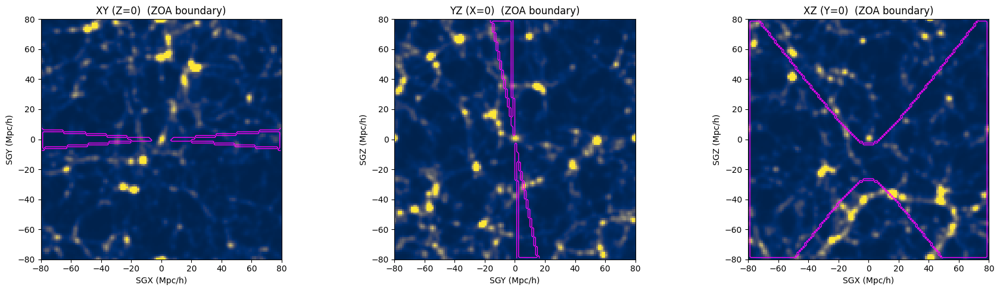

In [4]:
# -*- coding: utf-8 -*-
"""
Check real data presence inside the Zone of Avoidance (|b| < thresh_deg)
- Loads 3D field from true_test_path (dataset: 'output_rho')
- Computes galactic latitude b from supergalactic Cartesian grid
- Reports coverage & stats inside vs outside ZOA
- Visualizes XY/YZ/XZ slices with ZOA boundary contour (no masking)
"""

import h5py
import numpy as np
import matplotlib.pyplot as plt
from astropy.coordinates import SkyCoord, Supergalactic, CartesianRepresentation
import astropy.units as u

# -------------------- 사용자 설정 --------------------
index = 0
true_test_path = f"/gpfs/adupuy/cosmicweb_asim/ASIM_TSC/samples/test/{index}.hdf5"

L = 160.0         # 박스 길이 (Mpc/h 등)
thresh_deg = 5.0  # |b| < thresh_deg 를 ZOA로 정의
EPS = 0.0         # "데이터 존재" 판정 임계값 (연속 밀도면 0, 희소 카운트면 1 권장)

VIEW_CMAP = "cividis"  # 시각화 컬러맵
SLICE_MODE = "slice"   # "slice": 중앙 단층 / "proj": 깊이 평균

# -------------------- 유틸 --------------------
def to_DHW(a: np.ndarray) -> np.ndarray:
    a = np.asarray(a)
    while a.ndim > 3 and a.shape[0] == 1: a = a[0]
    while a.ndim > 3 and a.shape[0] == 1: a = a[0]
    if a.ndim == 5: a = a[0, 0]
    elif a.ndim == 4: a = a[0]
    elif a.ndim != 3: raise ValueError(f"Unexpected shape: {a.shape}")
    # (H,W,D) 추정 시 (D,H,W)로 전치
    if a.shape[2] == max(a.shape) and a.shape[0] != max(a.shape):
        a = a.transpose(2, 0, 1)
    return a  # (D,H,W)=(Z,Y,X)

def reduce2d(vol: np.ndarray, plane: str, mode: str) -> np.ndarray:
    D, H, W = vol.shape
    if plane == "xy":   return vol.mean(axis=0) if mode=="proj" else vol[D//2]
    if plane == "yz":   return vol.mean(axis=2) if mode=="proj" else vol[:, :, W//2]
    if plane == "xz":   return vol.mean(axis=1) if mode=="proj" else vol[:, H//2, :]
    raise ValueError

def b_grid_supergalactic(N: int, L: float) -> np.ndarray:
    axis = np.linspace(-L/2, L/2, N, dtype=np.float64)
    sgz, sgy, sgx = np.meshgrid(axis, axis, axis, indexing='ij')  # (Z,Y,X)
    rep = CartesianRepresentation(x=sgx.ravel()*u.Mpc,
                                  y=sgy.ravel()*u.Mpc,
                                  z=sgz.ravel()*u.Mpc)
    b = SkyCoord(rep, frame=Supergalactic()).galactic.b.radian
    return b.reshape((N, N, N))  # (Z,Y,X)

# -------------------- 데이터 로드 --------------------
with h5py.File(true_test_path, "r") as f:
    rho_true = f["output_rho"][:]   # 예상: (D,H,W) 또는 (1,D,H,W) 등
rho_true = to_DHW(rho_true)
N = rho_true.shape[0]
axis = np.linspace(-L/2, L/2, N, dtype=np.float64)

# -------------------- b 및 ZOA 마스크 --------------------
b = b_grid_supergalactic(N, L)          # (Z,Y,X), radians
ZOA = (np.abs(b) < np.radians(thresh_deg))  # bool

# -------------------- 커버리지/통계 --------------------
valid = np.isfinite(rho_true)           # NaN/Inf 제외
present = valid & (rho_true > EPS)      # "데이터 존재" 정의

inside = ZOA
outside = ~ZOA

def stats(mask, name):
    m = mask & valid
    if not np.any(m):
        print(f"[{name}] no valid voxels")
        return
    vals = rho_true[m]
    pres = present[m].mean()
    print(f"[{name}] voxels={m.sum():,} | present(frac>{EPS})={pres:.3f} | "
          f"min={np.nanmin(vals):.3g}  median={np.nanmedian(vals):.3g}  mean={np.nanmean(vals):.3g}  max={np.nanmax(vals):.3g}")

print(f"Total voxels: {rho_true.size:,} | ZOA fraction: {inside.mean():.3f}")
stats(inside, "ZOA (|b|<%.1f°)" % thresh_deg)
stats(outside, "Non-ZOA")

# -------------------- 시각화 (값은 그대로, ZOA는 경계만 표시) --------------------
planes = ["xy","yz","xz"]
titles = {"xy":"XY (Z=0)", "yz":"YZ (X=0)", "xz":"XZ (Y=0)"}

def make_boundary(mask2d: np.ndarray):
    """ZOA 경계선용: True 영역의 가장자리 픽셀만 추출(간단한 에지 검출)."""
    from scipy.ndimage import binary_erosion
    core = binary_erosion(mask2d, iterations=1, border_value=0)
    edge = mask2d & (~core)
    return edge

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
extent = [axis.min(), axis.max(), axis.min(), axis.max()]

# 공통 컬러 스케일(로그 스케일 선호 시 log1p 사용)
imgs_for_scale = []
for pl in planes:
    imgs_for_scale.append(reduce2d(rho_true, pl, SLICE_MODE))
stack = np.concatenate([im.ravel() for im in imgs_for_scale if np.isfinite(im).any()])
vmin, vmax = np.percentile(stack[np.isfinite(stack)], [1, 99])

for ax, pl in zip(axes, planes):
    img = reduce2d(rho_true, pl, SLICE_MODE)
    # 평면에 맞는 2D ZOA 마스크
    if pl == "xy":
        mask2d = ZOA.mean(axis=0) > 0 if SLICE_MODE=="proj" else ZOA[N//2]
        xlab, ylab = "SGX (Mpc/h)", "SGY (Mpc/h)"
    elif pl == "yz":
        mask2d = ZOA.mean(axis=2) > 0 if SLICE_MODE=="proj" else ZOA[:, :, N//2]
        xlab, ylab = "SGY (Mpc/h)", "SGZ (Mpc/h)"
    else:  # "xz"
        mask2d = ZOA.mean(axis=1) > 0 if SLICE_MODE=="proj" else ZOA[:, N//2, :]
        xlab, ylab = "SGX (Mpc/h)", "SGZ (Mpc/h)"

    ax.imshow(img, origin='lower', extent=extent, cmap=VIEW_CMAP,
              vmin=vmin, vmax=vmax)
    # 경계선만 얹기
    try:
        edge = make_boundary(mask2d.astype(bool))
        ax.contour(edge.astype(float), levels=[0.5], colors="magenta",
                   linewidths=1.0, origin='lower', extent=extent)
    except Exception:
        # scipy 없으면 단순 컨투어: 마스크 자체를 레벨=0.5로 표시
        ax.contour(mask2d.astype(float), levels=[0.5], colors="magenta",
                   linewidths=1.0, origin='lower', extent=extent)

    ax.set_title(f"{titles[pl]}  (ZOA boundary)")
    ax.set_xlabel(xlab); ax.set_ylabel(ylab)

plt.tight_layout(); plt.show()


In [5]:
def normalize_input_2ch(x):
    a = np.asarray(x)
    while a.ndim > 4 and a.shape[0] == 1:
        a = a[0]
    if a.ndim == 4 and a.shape[0] == 2: return a
    if a.ndim == 4 and a.shape[-1] == 2: return a.transpose(3,0,1,2)
    if a.ndim == 5 and a.shape[0] == 1 and a.shape[1] == 2: return a[0]
    a_s = np.squeeze(a)
    if a_s.ndim == 4 and a_s.shape[0] == 2: return a_s
    if a_s.ndim == 4 and a_s.shape[-1] == 2: return a_s.transpose(3,0,1,2)
    raise AssertionError(f"input shape={a.shape}, squeeze→{a_s.shape}")

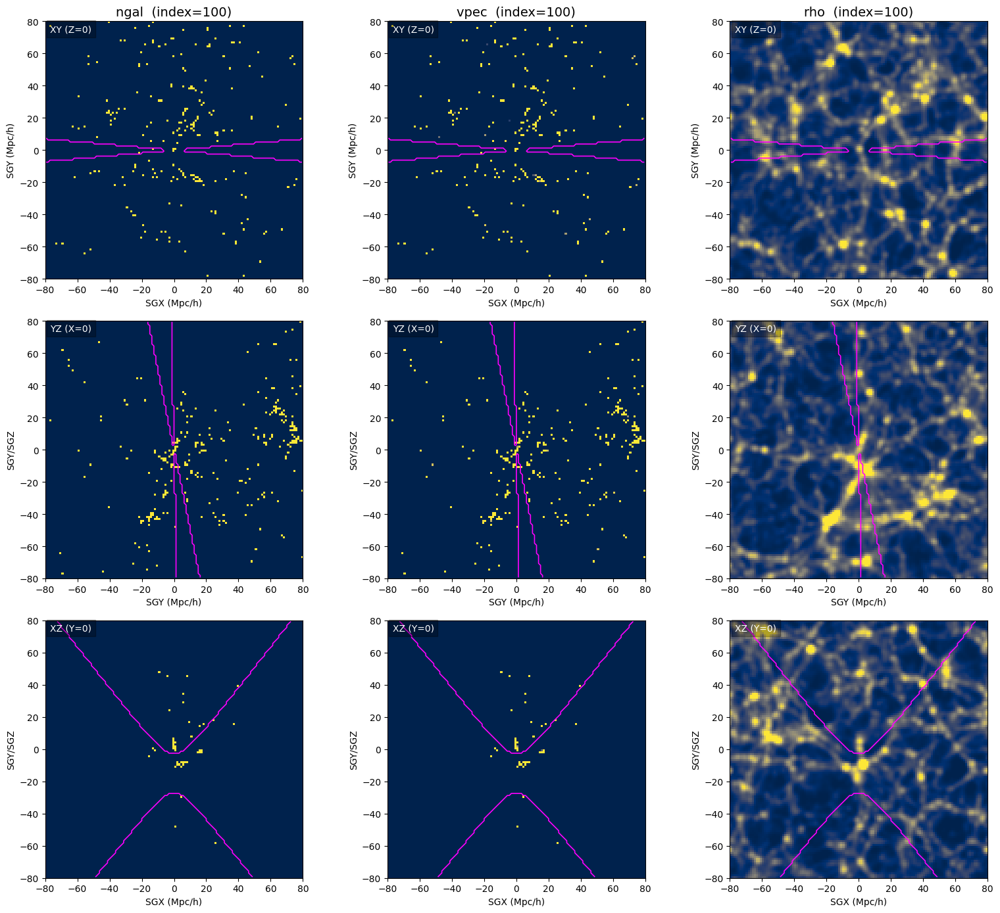

In [6]:
# -*- coding: utf-8 -*-
"""
Compare ngal, vpec, output_rho with ZOA boundary (|b| < 5°)
Input:
    - f["input"][:] -> shape (2, D, H, W) after normalize_input_2ch()
      x[0] = ngal, x[1] = vpec
    - f["output_rho"] -> truth density
"""

import h5py
import numpy as np
import matplotlib.pyplot as plt
from astropy.coordinates import SkyCoord, Supergalactic, CartesianRepresentation
import astropy.units as u

# ---------------- 사용자 설정 ----------------
index = 100
true_test_path = f"/gpfs/adupuy/cosmicweb_asim/ASIM_TSC/samples/test/{index}.hdf5"
L = 160.0
thresh_deg = 5.0
VIEW_CMAP = "cividis"
SLICE_MODE = "slice"  # "slice" 또는 "proj"


# ---------------- 유틸 ----------------
def to_DHW(a):
    a = np.asarray(a)
    while a.ndim > 3 and a.shape[0] == 1: a = a[0]
    while a.ndim > 3 and a.shape[0] == 1: a = a[0]
    if a.ndim == 5: a = a[0,0]
    elif a.ndim == 4: a = a[0]
    if a.ndim != 3:
        raise ValueError(f"Unexpected shape {a.shape}")
    if a.shape[2] == max(a.shape) and a.shape[0] != max(a.shape):
        a = a.transpose(2,0,1)
    return a

def reduce2d(vol, plane, mode):
    D, H, W = vol.shape
    return {
        "xy": vol.mean(axis=0) if mode=="proj" else vol[D//2],
        "yz": vol.mean(axis=2) if mode=="proj" else vol[:, :, W//2],
        "xz": vol.mean(axis=1) if mode=="proj" else vol[:, H//2, :]
    }[plane]

def b_grid(N, L):
    axis = np.linspace(-L/2, L/2, N)
    sgz, sgy, sgx = np.meshgrid(axis, axis, axis, indexing='ij')
    rep = CartesianRepresentation(sgx.ravel()*u.Mpc,
                                  sgy.ravel()*u.Mpc,
                                  sgz.ravel()*u.Mpc)
    b = SkyCoord(rep, frame=Supergalactic()).galactic.b.radian
    return b.reshape((N,N,N))

# ---------------- 데이터 로드 ----------------
with h5py.File(true_test_path, "r") as f:
    x = normalize_input_2ch(f["input"][:])   # (2,D,H,W) expected
    ngal = to_DHW(x[0])
    vpec = to_DHW(x[1])
    rho  = to_DHW(f["output_rho"][:])

N = rho.shape[0]
axis = np.linspace(-L/2, L/2, N)
b = b_grid(N, L)
ZOA = (np.abs(b) < np.radians(thresh_deg))

# ---------------- 시각화 (3×3) ----------------
planes = ["xy","yz","xz"]
titles = {"xy":"XY (Z=0)", "yz":"YZ (X=0)", "xz":"XZ (Y=0)"}
datasets = [("ngal", ngal), ("vpec", vpec), ("rho", rho)]

fig, axes = plt.subplots(3,3, figsize=(16,14))
extent = [axis.min(), axis.max(), axis.min(), axis.max()]

for col, (name, vol) in enumerate(datasets):

    # 공통 color range (로그 스케일 log1p)
    stack = []
    tmp = {}
    for pl in planes:
        img = reduce2d(vol, pl, SLICE_MODE)
        img_disp = np.log1p(np.abs(img)) if name == "vpec" else np.log1p(img)
        tmp[pl] = img_disp
        stack.append(img_disp.ravel())
    vmin, vmax = np.nanpercentile(np.concatenate(stack), [1, 99])

    for row, pl in enumerate(planes):
        ax = axes[row,col]
        img = tmp[pl]
        ax.imshow(img, origin='lower', cmap=VIEW_CMAP, extent=extent,
                  vmin=vmin, vmax=vmax)

        # ZOA 경계선
        if pl=="xy": mask2d = ZOA[N//2]
        elif pl=="yz": mask2d = ZOA[:, :, N//2]
        else: mask2d = ZOA[:, N//2, :]

        ax.contour(mask2d.astype(float), levels=[0.5], colors="magenta",
                   linewidths=1.2, origin='lower', extent=extent)

        if row == 0:
            ax.set_title(f"{name}  (index={index})", fontsize=14)
        ax.set_xlabel("SGX (Mpc/h)" if pl!="yz" else "SGY (Mpc/h)")
        ax.set_ylabel("SGY/SGZ" if pl!="xy" else "SGY (Mpc/h)")
        ax.text(0.02,0.96, titles[pl], transform=ax.transAxes,
                color="white", fontsize=10,
                bbox=dict(fc="black", alpha=0.3))

plt.tight_layout()
plt.show()


/tmp/ipykernel_1581085/3779025163.py:106: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(VIEW_CMAP)
/tmp/ipykernel_1581085/3779025163.py:205: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.88, 1])


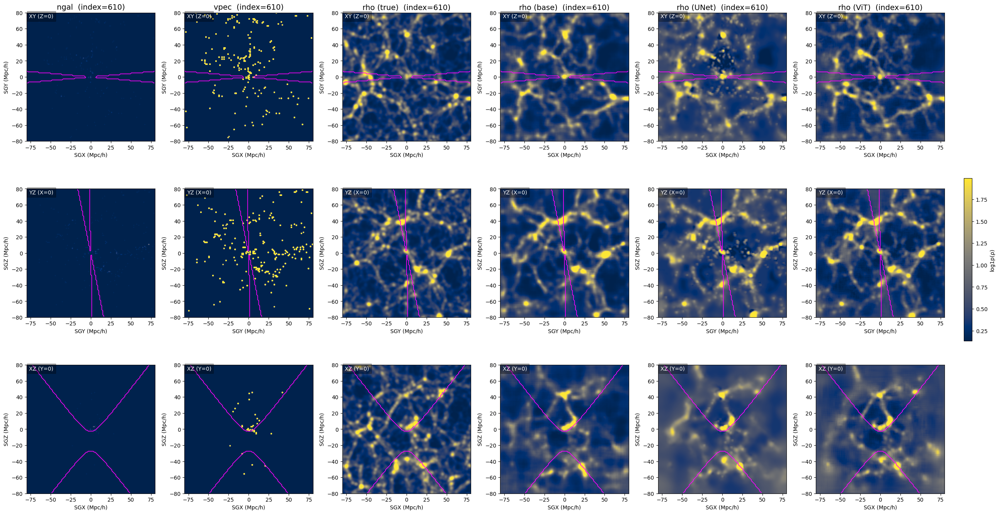

In [7]:
# -*- coding: utf-8 -*-
"""
3x6 figure:
[ngal | vpec | rho_true]  ||  [rho_base | rho_unet | rho_vit]
각 패널에 ZOA(|b|<5°) 경계 표시, 세 행은 XY/YZ/XZ 평면.
"""

import os
import h5py
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from astropy.coordinates import SkyCoord, Supergalactic, CartesianRepresentation
import astropy.units as u

# ---------------- 사용자 설정 ----------------
index = 610  # int 또는 str 가능
L = 160.0
thresh_deg = 5.0
VIEW_CMAP = "cividis"
SLICE_MODE = "slice"     # "slice" 또는 "proj"

# 경로
true_test_path = f"/gpfs/adupuy/cosmicweb_asim/ASIM_TSC/samples/test/{index}.hdf5"
base_path      = "/gpfs/adupuy/cosmicweb_asim/ASIM_TSC/samples/predictions/"
unet_pred_path = "/home/mingyeong/GAL2DM_ASIM_VNET/results/unet_predictions/28845/icase-both-keep2"
vit_pred_path  = "/home/mingyeong/GAL2DM_ASIM_ViT/results/vit_predictions/28846/icase-both"

# ---------------- 유틸 ----------------
def to_DHW(a):
    a = np.asarray(a)
    while a.ndim > 3 and a.shape[0] == 1: a = a[0]
    while a.ndim > 3 and a.shape[0] == 1: a = a[0]
    if a.ndim == 5: a = a[0,0]
    elif a.ndim == 4: a = a[0]
    if a.ndim != 3:
        raise ValueError(f"Unexpected shape {a.shape}")
    if a.shape[2] == max(a.shape) and a.shape[0] != max(a.shape):
        a = a.transpose(2,0,1)
    return a

def reduce2d(vol, plane, mode):
    D, H, W = vol.shape
    return {
        "xy": vol.mean(axis=0) if mode=="proj" else vol[D//2],
        "yz": vol.mean(axis=2) if mode=="proj" else vol[:, :, W//2],
        "xz": vol.mean(axis=1) if mode=="proj" else vol[:, H//2, :],
    }[plane]

def b_grid(N, L):
    axis = np.linspace(-L/2, L/2, N)
    sgz, sgy, sgx = np.meshgrid(axis, axis, axis, indexing='ij')  # (Z,Y,X)
    rep = CartesianRepresentation(sgx.ravel()*u.Mpc,
                                  sgy.ravel()*u.Mpc,
                                  sgz.ravel()*u.Mpc)
    b = SkyCoord(rep, frame=Supergalactic()).galactic.b.radian
    return b.reshape((N,N,N))

def load_pred_h5(path, dataset="prediction"):
    with h5py.File(path, "r") as f:
        arr = f[dataset][:]
    return to_DHW(arr)

# ---------------- 데이터 로드 ----------------
with h5py.File(true_test_path, "r") as f:
    x = normalize_input_2ch(f["input"][:])   # 외부 제공 함수: (2,D,H,W)
    ngal = to_DHW(x[0])
    vpec = to_DHW(x[1])
    rho_true = to_DHW(f["output_rho"][:])

# 예측 로드
idx_str = str(index)
unet_path = os.path.join(unet_pred_path, f"{idx_str}.hdf5")
vit_path  = os.path.join(vit_pred_path,  f"{idx_str}.hdf5")
rho_unet = load_pred_h5(unet_path)
rho_vit  = load_pred_h5(vit_path)

# base: log10(ρ)/2.5 라고 가정 → ρ 역변환
base_npy = os.path.join(
    base_path,
    f"test_{idx_str}_final_mode0_lr_min1e-07_max1e-05_200epochs_rho_240712_a100_cmb_f2.5.npy"
)
if os.path.isfile(base_npy):
    base_raw = np.load(base_npy)
    rho_base = 10**(2.5 * base_raw)
    rho_base = to_DHW(rho_base)
else:
    # 파일 없으면 빈 값 대신 true와 같은 shape의 NaN으로 채워 패널 표시만 건너뜀
    rho_base = np.full_like(rho_true, np.nan)
    print(f"[WARN] base npy not found: {base_npy}")

# ---------------- 좌표/ZOA ----------------
N = rho_true.shape[0]
axis = np.linspace(-L/2, L/2, N)
B = b_grid(N, L)
ZOA = (np.abs(B) < np.radians(thresh_deg))

# ---------------- 시각화 ----------------
planes = ["xy","yz","xz"]
plane_title = {"xy":"XY (Z=0)", "yz":"YZ (X=0)", "xz":"XZ (Y=0)"}
datasets_L = [("ngal", ngal), ("vpec", vpec), ("rho (true)", rho_true)]
datasets_R = [("rho (base)", rho_base), ("rho (UNet)", rho_unet), ("rho (ViT)", rho_vit)]

fig, axes = plt.subplots(3, 6, figsize=(28, 14))
extent = [axis.min(), axis.max(), axis.min(), axis.max()]
cmap = cm.get_cmap(VIEW_CMAP)

# ---- 왼쪽 3열 (입력/진실) : 컬러바 공유 ----
group_L_axes = []
for col, (name, vol) in enumerate(datasets_L):
    # 공통 컬러스케일 계산 (세 평면 합산 후 1–99백분위)
    stack, imgs = [], {}
    for pl in planes:
        img = reduce2d(vol, pl, SLICE_MODE)
        img_disp = np.log1p(np.abs(img)) if name == "vpec" else np.log1p(img)
        imgs[pl] = img_disp
        stack.append(img_disp.ravel())
    vmin, vmax = np.nanpercentile(np.concatenate(stack), [1, 99])
    if not np.isfinite(vmin) or not np.isfinite(vmax) or vmin == vmax:
        vmin, vmax = 0.0, 1.0

    for row, pl in enumerate(planes):
        ax = axes[row, col]
        group_L_axes.append(ax)
        ax.imshow(imgs[pl], origin='lower', cmap=cmap, vmin=vmin, vmax=vmax, extent=extent)

        # ZOA 경계
        if pl == "xy": mask2d = ZOA[N//2]
        elif pl == "yz": mask2d = ZOA[:, :, N//2]
        else: mask2d = ZOA[:, N//2, :]
        ax.contour(mask2d.astype(float), levels=[0.5], colors="magenta",
                   linewidths=1.2, origin='lower', extent=extent)

        if row == 0:
            ax.set_title(f"{name}  (index={index})", fontsize=14)

        if pl == "xy":
            ax.set_xlabel("SGX (Mpc/h)"); ax.set_ylabel("SGY (Mpc/h)")
        elif pl == "yz":
            ax.set_xlabel("SGY (Mpc/h)"); ax.set_ylabel("SGZ (Mpc/h)")
        else:
            ax.set_xlabel("SGX (Mpc/h)"); ax.set_ylabel("SGZ (Mpc/h)")

        ax.text(0.02, 0.96, plane_title[pl], transform=ax.transAxes,
                color="white", fontsize=10, bbox=dict(fc="black", alpha=0.3))

# 왼쪽 컬러바
mappable_L = cm.ScalarMappable(cmap=cmap)
mappable_L.set_array([])  # 값은 axes에서 가져옴
# colorbar를 만들기 위해 하나의 축에서 norm을 가져옴: 마지막 그려진 이미지의 norm 사용
im0 = axes[0,0].images[0]
mappable_L.set_cmap(im0.get_cmap())
mappable_L.set_norm(im0.norm)
#cbar_L = fig.colorbar(mappable_L, ax=axes[:, :3].ravel().tolist(),
#                      fraction=0.02, pad=0.02, label="log1p(value)")

# ---- 오른쪽 3열 (예측들) : 컬러바 공유 ----
group_R_axes = []
for j, (name, vol) in enumerate(datasets_R, start=3):
    # NaN(=base가 없을 때) 처리: 표시만 스킵
    stack, imgs = [], {}
    for pl in planes:
        img = reduce2d(vol, pl, SLICE_MODE)
        img_disp = np.log1p(img)  # 모두 밀도장
        imgs[pl] = img_disp
        stack.append(img_disp.ravel())
    vmin, vmax = np.nanpercentile(np.concatenate(stack), [1, 99])
    if not np.isfinite(vmin) or not np.isfinite(vmax) or vmin == vmax:
        vmin, vmax = 0.0, 1.0

    for row, pl in enumerate(planes):
        ax = axes[row, j]
        group_R_axes.append(ax)
        ax.imshow(imgs[pl], origin='lower', cmap=cmap, vmin=vmin, vmax=vmax, extent=extent)

        # ZOA 경계
        if pl == "xy": mask2d = ZOA[N//2]
        elif pl == "yz": mask2d = ZOA[:, :, N//2]
        else: mask2d = ZOA[:, N//2, :]
        ax.contour(mask2d.astype(float), levels=[0.5], colors="magenta",
                   linewidths=1.2, origin='lower', extent=extent)

        if row == 0:
            ax.set_title(f"{name}  (index={index})", fontsize=14)

        if pl == "xy":
            ax.set_xlabel("SGX (Mpc/h)"); ax.set_ylabel("SGY (Mpc/h)")
        elif pl == "yz":
            ax.set_xlabel("SGY (Mpc/h)"); ax.set_ylabel("SGZ (Mpc/h)")
        else:
            ax.set_xlabel("SGX (Mpc/h)"); ax.set_ylabel("SGZ (Mpc/h)")

        ax.text(0.02, 0.96, plane_title[pl], transform=ax.transAxes,
                color="white", fontsize=10, bbox=dict(fc="black", alpha=0.3))

# 오른쪽 컬러바
mappable_R = cm.ScalarMappable(cmap=cmap)
mappable_R.set_array([])
imR = axes[0,3].images[0]
mappable_R.set_cmap(imR.get_cmap())
mappable_R.set_norm(imR.norm)
cbar_R = fig.colorbar(mappable_R, ax=axes[:, 3:].ravel().tolist(),
                      fraction=0.02, pad=0.02, label="log1p(ρ)")

plt.tight_layout(rect=[0, 0, 0.88, 1])
plt.show()


[Density Scale] vmin=0.049, vmax=0.913


/tmp/ipykernel_1581085/4061078929.py:143: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(VIEW_CMAP)
/tmp/ipykernel_1581085/4061078929.py:235: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.88, 1])


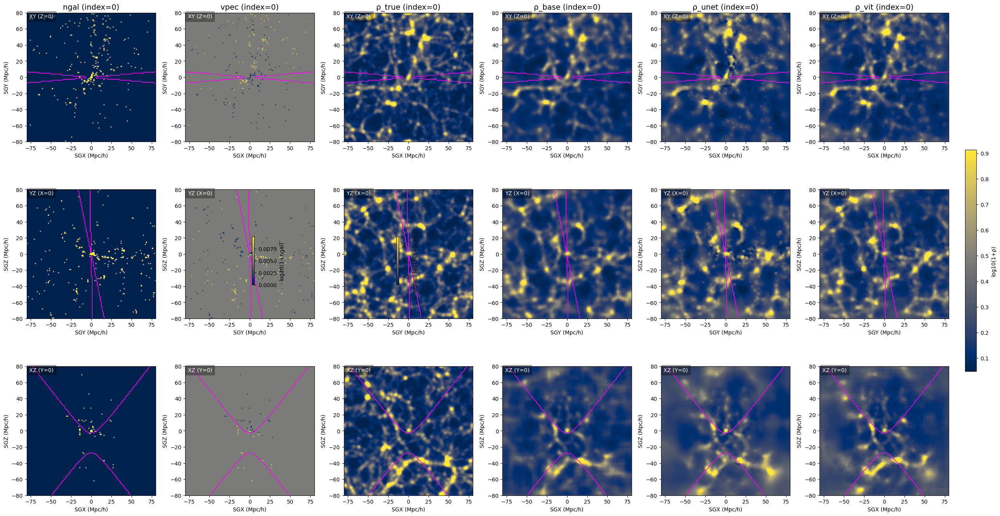

In [8]:
# -*- coding: utf-8 -*-
"""
3x6 figure:
[ngal | vpec | rho_true]  ||  [rho_base | rho_unet | rho_vit]
- 왼쪽 2열(ngal, vpec)만 개별 colorbar
- density 계열(ρ_true, ρ_base, ρ_unet, ρ_vit)은 공통 vmin/vmax + 오른쪽 공통 colorbar
- 각 패널 ZOA(|b|<5°) 경계 표시, 세 행은 XY/YZ/XZ 평면
"""

import os
import h5py
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from astropy.coordinates import SkyCoord, Supergalactic, CartesianRepresentation
import astropy.units as u

# ---------------- 사용자 설정 ----------------
index = 0  # int 또는 str 가능
L = 160.0
thresh_deg = 5.0
VIEW_CMAP = "cividis"
SLICE_MODE = "slice"     # "slice" 또는 "proj"

# 경로
true_test_path = f"/gpfs/adupuy/cosmicweb_asim/ASIM_TSC/samples/test/{index}.hdf5"
base_path      = "/gpfs/adupuy/cosmicweb_asim/ASIM_TSC/samples/predictions/"
unet_pred_path = "/home/mingyeong/GAL2DM_ASIM_VNET/results/unet_predictions/28845/icase-both-keep2"
vit_pred_path  = "/home/mingyeong/GAL2DM_ASIM_ViT/results/vit_predictions/28846/icase-both"

# ---------------- 유틸 ----------------
def to_DHW(a):
    a = np.asarray(a)
    while a.ndim > 3 and a.shape[0] == 1: a = a[0]
    while a.ndim > 3 and a.shape[0] == 1: a = a[0]
    if a.ndim == 5: a = a[0,0]
    elif a.ndim == 4: a = a[0]
    if a.ndim != 3:
        raise ValueError(f"Unexpected shape {a.shape}")
    if a.shape[2] == max(a.shape) and a.shape[0] != max(a.shape):
        a = a.transpose(2,0,1)
    return a

def reduce2d(vol, plane, mode):
    D, H, W = vol.shape
    return {
        "xy": vol.mean(axis=0) if mode=="proj" else vol[D//2],
        "yz": vol.mean(axis=2) if mode=="proj" else vol[:, :, W//2],
        "xz": vol.mean(axis=1) if mode=="proj" else vol[:, H//2, :],
    }[plane]

def b_grid(N, L):
    axis = np.linspace(-L/2, L/2, N)
    sgz, sgy, sgx = np.meshgrid(axis, axis, axis, indexing='ij')  # (Z,Y,X)
    rep = CartesianRepresentation(sgx.ravel()*u.Mpc,
                                  sgy.ravel()*u.Mpc,
                                  sgz.ravel()*u.Mpc)
    b = SkyCoord(rep, frame=Supergalactic()).galactic.b.radian
    return b.reshape((N,N,N))

def load_pred_h5(path, dataset="prediction"):
    with h5py.File(path, "r") as f:
        arr = f[dataset][:]
    return to_DHW(arr)

def robust_minmax(arr_list):
    """여러 2D 이미지를 이어서 1–99% 백분위로 vmin/vmax 계산"""
    stack = np.concatenate([a.ravel() for a in arr_list])
    vmin, vmax = np.nanpercentile(stack, [1, 99])
    if not np.isfinite(vmin) or not np.isfinite(vmax) or vmin == vmax:
        vmin, vmax = float(np.nanmin(stack)), float(np.nanmax(stack))
    if vmin == vmax:
        vmin, vmax = vmin - 1.0, vmax + 1.0
    return vmin, vmax

def log10p(a):
    """log10(1+a), a>=0 가정"""
    return np.log10(1.0 + np.clip(a, a_min=0, a_max=None))

def vpec_signedlog10(a):
    """부호 보존 signed log10(1+|vpec|)"""
    return np.sign(a) * np.log10(1.0 + np.abs(a))

# ---------------- 데이터 로드 ----------------
with h5py.File(true_test_path, "r") as f:
    x = normalize_input_2ch(f["input"][:])   # 외부 제공 함수: (2,D,H,W)
    ngal = to_DHW(x[0])
    vpec = to_DHW(x[1])
    rho_true = to_DHW(f["output_rho"][:])

# 예측 로드
idx_str = str(index)
unet_path = os.path.join(unet_pred_path, f"{idx_str}.hdf5")
vit_path  = os.path.join(vit_pred_path,  f"{idx_str}.hdf5")
rho_unet = load_pred_h5(unet_path)
rho_vit  = load_pred_h5(vit_path)

# base: log10(ρ)/2.5 라고 가정 → ρ 역변환
base_npy = os.path.join(
    base_path,
    f"test_{idx_str}_final_mode0_lr_min1e-07_max1e-05_200epochs_rho_240712_a100_cmb_f2.5.npy"
)
if os.path.isfile(base_npy):
    base_raw = np.load(base_npy)
    rho_base = 10**(2.5 * base_raw)
    rho_base = to_DHW(rho_base)
else:
    rho_base = np.full_like(rho_true, np.nan)
    print(f"[WARN] base npy not found: {base_npy}")

# ---------------- 좌표/ZOA ----------------
N = rho_true.shape[0]
axis = np.linspace(-L/2, L/2, N)
B = b_grid(N, L)
ZOA = (np.abs(B) < np.radians(thresh_deg))

# ---------------- Density log 변환 + 공통 스케일 ----------------
rhoT = {
    "ρ_true": log10p(rho_true),
    "ρ_base": log10p(rho_base),
    "ρ_unet": log10p(rho_unet),
    "ρ_vit":  log10p(rho_vit),
}

planes = ["xy","yz","xz"]
# density 전체(진실+예측, 3평면)로 하나의 vmin/vmax
stack = []
for name, vol in rhoT.items():
    for pl in planes:
        stack.append(reduce2d(vol, pl, SLICE_MODE).ravel())
vmin_rho, vmax_rho = np.nanpercentile(np.concatenate(stack), [1, 99])
print(f"[Density Scale] vmin={vmin_rho:.3f}, vmax={vmax_rho:.3f}")

# ---------------- 시각화 ----------------
plane_title = {"xy":"XY (Z=0)", "yz":"YZ (X=0)", "xz":"XZ (Y=0)"}
datasets_L = [("ngal", ngal), ("vpec", vpec), ("ρ_true", rhoT["ρ_true"])]
datasets_R = [("ρ_base", rhoT["ρ_base"]),
              ("ρ_unet", rhoT["ρ_unet"]),
              ("ρ_vit",  rhoT["ρ_vit"])]

fig, axes = plt.subplots(3, 6, figsize=(28, 14))
extent = [axis.min(), axis.max(), axis.min(), axis.max()]
cmap = cm.get_cmap(VIEW_CMAP)

# ---- 왼쪽 3열 (입력/진실) ----
for col, (name, vol) in enumerate(datasets_L):
    imgs = {}
    # 평면별 2D 슬라이스 + 표현 변환 적용
    for pl in planes:
        img2d = reduce2d(vol, pl, SLICE_MODE)
        if name == "ngal":
            img2d = log10p(img2d)  # ngal ≥ 0
        elif name == "vpec":
            img2d = vpec_signedlog10(img2d)
        else:  # ρ_true는 이미 log10(1+ρ) 상태
            pass
        imgs[pl] = img2d

    # 스케일: ngal/vpec은 각자 열 별로 개별 범위, ρ_true는 density 공통 범위 사용
    if name == "ρ_true":
        vmin, vmax = vmin_rho, vmax_rho
    else:
        vmin, vmax = robust_minmax([imgs[p] for p in planes])

    # 그림 + ZOA + 타이틀/라벨
    last_im = None
    for row, pl in enumerate(planes):
        ax = axes[row, col]
        im = ax.imshow(imgs[pl], origin='lower', cmap=cmap,
                       vmin=vmin, vmax=vmax, extent=extent)
        last_im = im

        # ZOA 경계선
        if pl=="xy": mask2d = ZOA[N//2]
        elif pl=="yz": mask2d = ZOA[:, :, N//2]
        else: mask2d = ZOA[:, N//2, :]
        ax.contour(mask2d.astype(float), levels=[0.5], colors="magenta",
                   linewidths=1.2, origin='lower', extent=extent)

        if row == 0:
            ax.set_title(f"{name} (index={index})", fontsize=14)

        if pl == "xy":
            ax.set_xlabel("SGX (Mpc/h)"); ax.set_ylabel("SGY (Mpc/h)")
        elif pl == "yz":
            ax.set_xlabel("SGY (Mpc/h)"); ax.set_ylabel("SGZ (Mpc/h)")
        else:
            ax.set_xlabel("SGX (Mpc/h)"); ax.set_ylabel("SGZ (Mpc/h)")

        ax.text(0.02, 0.96, plane_title[pl], transform=ax.transAxes,
                color="white", fontsize=10, bbox=dict(fc="black", alpha=0.3))

    # ✅ 왼쪽 2열(ngal, vpec)만 개별 colorbar 추가
    if col in (0, 1):  # 0: ngal, 1: vpec
        cbar = fig.colorbar(last_im, ax=axes[:, col].ravel().tolist(),
                            fraction=0.02, pad=0.02)
        label = "log10(1+ngal)" if col == 0 else "signed log10(1+|vpec|)"
        cbar.set_label(label, fontsize=10)

# ---- 오른쪽 3열 (ρ predictions with unified scale) ----
for j, (name, vol) in enumerate(datasets_R, start=3):
    for row, pl in enumerate(planes):
        ax = axes[row, j]
        img = reduce2d(vol, pl, SLICE_MODE)
        im = ax.imshow(img, origin='lower', cmap=cmap,
                       vmin=vmin_rho, vmax=vmax_rho, extent=extent)

        # ZOA 경계
        if pl=="xy": mask2d = ZOA[N//2]
        elif pl=="yz": mask2d = ZOA[:, :, N//2]
        else: mask2d = ZOA[:, N//2, :]
        ax.contour(mask2d.astype(float), levels=[0.5], colors="magenta",
                   linewidths=1.2, origin='lower', extent=extent)

        if row == 0:
            ax.set_title(f"{name} (index={index})", fontsize=14)

        if pl == "xy":
            ax.set_xlabel("SGX (Mpc/h)"); ax.set_ylabel("SGY (Mpc/h)")
        elif pl == "yz":
            ax.set_xlabel("SGY (Mpc/h)"); ax.set_ylabel("SGZ (Mpc/h)")
        else:
            ax.set_xlabel("SGX (Mpc/h)"); ax.set_ylabel("SGZ (Mpc/h)")

        ax.text(0.02, 0.96, plane_title[pl], transform=ax.transAxes,
                color="white", fontsize=10, bbox=dict(fc="black", alpha=0.3))

# -> density 그룹 공통 colorbar (ρ_true 포함한 공통 스케일에 맞춤)
mappable_R = cm.ScalarMappable(cmap=cmap)
mappable_R.set_array([])
mappable_R.set_norm(plt.Normalize(vmin_rho, vmax_rho))
cbar_R = fig.colorbar(mappable_R, ax=axes[:, 2:].ravel().tolist(),
                      fraction=0.02, pad=0.02, label="log10(1+ρ)")

plt.tight_layout(rect=[0, 0, 0.88, 1])
plt.show()


/tmp/ipykernel_1581085/246832703.py:79: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(right=0.86, wspace=0.15, hspace=0.15)


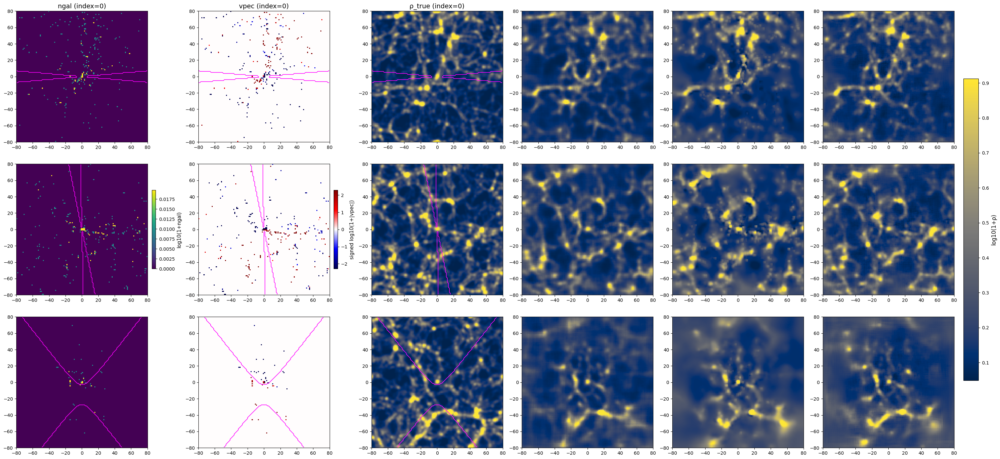

In [9]:
# --- 변경 사항 요약 ---
# 1) fig = plt.subplots(..., constrained_layout=True) 로 변경
# 2) fig.subplots_adjust(right=0.86, wspace=0.15, hspace=0.15) 추가
# 3) ngal/vpec 색상 대비를 위해 colormap 변경 + percentile 범위 강화
# ---------------------------------------------------------------

fig, axes = plt.subplots(3, 6, figsize=(30, 14), constrained_layout=True)
extent = [axis.min(), axis.max(), axis.min(), axis.max()]

# 수정된 cmap
cmap_ngal = "viridis"
cmap_vpec = "seismic"   # signed → diverging colormap
cmap_rho  = "cividis"

# ---------------------------------------------------------
# 왼쪽 3열 (ngal, vpec, ρ_true)
# ---------------------------------------------------------
for col, (name, vol) in enumerate(datasets_L):
    imgs = {}
    for pl in planes:
        img2d = reduce2d(vol, pl, SLICE_MODE)

        if name == "ngal":
            img2d = log10p(img2d)
        elif name == "vpec":
            img2d = vpec_signedlog10(img2d)

        imgs[pl] = img2d

    # --- 🎯 여기 핵심: ngal, vpec 는 더 강한 contrast ---
    if name == "ngal":
        vmin, vmax = np.nanpercentile(np.concatenate([i.ravel() for i in imgs.values()]), [0.1, 99.9])
        cmap_use = cmap_ngal
    elif name == "vpec":
        vmax_abs = np.nanpercentile(np.abs(np.concatenate([i.ravel() for i in imgs.values()])), 99.5)
        vmin, vmax = -vmax_abs, vmax_abs
        cmap_use = cmap_vpec
    else:
        vmin, vmax = vmin_rho, vmax_rho
        cmap_use = cmap_rho

    last_im = None
    for row, pl in enumerate(planes):
        ax = axes[row, col]
        im = ax.imshow(imgs[pl], origin='lower', cmap=cmap_use,
                       vmin=vmin, vmax=vmax, extent=extent)
        last_im = im

        # ZOA
        if pl=="xy": mask2d = ZOA[N//2]
        elif pl=="yz": mask2d = ZOA[:, :, N//2]
        else: mask2d = ZOA[:, N//2, :]
        ax.contour(mask2d.astype(float), levels=[0.5], colors="magenta", linewidths=1.2, origin='lower', extent=extent)

        if row == 0:
            ax.set_title(f"{name} (index={index})", fontsize=14)

    # ✅ 개별 colorbar: ngal, vpec에만
    if col in (0, 1):
        cbar = fig.colorbar(last_im, ax=axes[:, col].ravel().tolist(), fraction=0.03, pad=0.01)
        cbar.set_label("log10(1+ngal)" if col == 0 else "signed log10(1+|vpec|)", fontsize=11)

# ---------------------------------------------------------
# 오른쪽 3열 (ρ_base, ρ_unet, ρ_vit) – 공통 색상 스케일 유지
# ---------------------------------------------------------
for j, (name, vol) in enumerate(datasets_R, start=3):
    for row, pl in enumerate(planes):
        ax = axes[row, j]
        img = reduce2d(vol, pl, SLICE_MODE)
        im = ax.imshow(img, origin='lower', cmap=cmap_rho,
                       vmin=vmin_rho, vmax=vmax_rho, extent=extent)

# 공통 colorbar (오른쪽)
mappable_R = plt.cm.ScalarMappable(norm=plt.Normalize(vmin_rho, vmax_rho), cmap=cmap_rho)
cbar_R = fig.colorbar(mappable_R, ax=axes[:, 3:].ravel().tolist(), fraction=0.035, pad=0.015)
cbar_R.set_label("log10(1+ρ)", fontsize=12)

# 🔧 레이아웃 충돌 해결
fig.subplots_adjust(right=0.86, wspace=0.15, hspace=0.15)
plt.show()


[Density Scale] vmin=0.049, vmax=0.913


/tmp/ipykernel_1581085/3634599771.py:136: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(right=0.86, wspace=0.15, hspace=0.15)


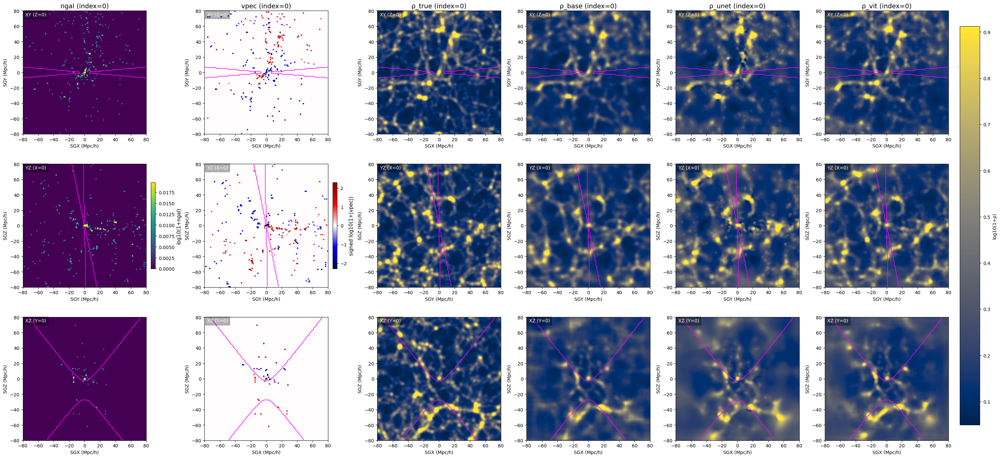

In [10]:
# -*- coding: utf-8 -*-
"""
3x6 figure:
[ngal | vpec | rho_true]  ||  [rho_base | rho_unet | rho_vit]
- 왼쪽 2열(ngal, vpec)만 개별 colorbar
- density 계열(ρ_true, ρ_base, ρ_unet, ρ_vit)은 공통 vmin/vmax + 오른쪽 공통 colorbar
- 각 패널 ZOA(|b|<5°) 경계 표시, 세 행은 XY/YZ/XZ 평면
"""

import os
import h5py
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from astropy.coordinates import SkyCoord, Supergalactic, CartesianRepresentation
import astropy.units as u

# ---------------- 사용자 설정 ----------------
index = 0  # int 또는 str 가능
L = 160.0
thresh_deg = 5.0
DENSITY_CMAP = "cividis"    # density용
NGAL_CMAP    = "viridis"    # ngal용
VPEC_CMAP    = "seismic"    # vpec용 (부호 보존 diverging)
SLICE_MODE   = "slice"      # "slice" 또는 "proj"

# 경로
true_test_path = f"/gpfs/adupuy/cosmicweb_asim/ASIM_TSC/samples/test/{index}.hdf5"
base_path      = "/gpfs/adupuy/cosmicweb_asim/ASIM_TSC/samples/predictions/"
unet_pred_path = "/home/mingyeong/GAL2DM_ASIM_VNET/results/unet_predictions/28845/icase-both-keep2"
vit_pred_path  = "/home/mingyeong/GAL2DM_ASIM_ViT/results/vit_predictions/28846/icase-both"

# ---------------- 유틸 ----------------
def to_DHW(a):
    a = np.asarray(a)
    while a.ndim > 3 and a.shape[0] == 1: a = a[0]
    while a.ndim > 3 and a.shape[0] == 1: a = a[0]
    if a.ndim == 5: a = a[0,0]
    elif a.ndim == 4: a = a[0]
    if a.ndim != 3:
        raise ValueError(f"Unexpected shape {a.shape}")
    if a.shape[2] == max(a.shape) and a.shape[0] != max(a.shape):
        a = a.transpose(2,0,1)
    return a

def reduce2d(vol, plane, mode):
    D, H, W = vol.shape
    return {
        "xy": vol.mean(axis=0) if mode=="proj" else vol[D//2],
        "yz": vol.mean(axis=2) if mode=="proj" else vol[:, :, W//2],
        "xz": vol.mean(axis=1) if mode=="proj" else vol[:, H//2, :],
    }[plane]

def b_grid(N, L):
    axis = np.linspace(-L/2, L/2, N)
    sgz, sgy, sgx = np.meshgrid(axis, axis, axis, indexing='ij')  # (Z,Y,X)
    rep = CartesianRepresentation(sgx.ravel()*u.Mpc,
                                  sgy.ravel()*u.Mpc,
                                  sgz.ravel()*u.Mpc)
    b = SkyCoord(rep, frame=Supergalactic()).galactic.b.radian
    return b.reshape((N,N,N))

def load_pred_h5(path, dataset="prediction"):
    with h5py.File(path, "r") as f:
        arr = f[dataset][:]
    return to_DHW(arr)

def log10p(a):
    """log10(1+a), a>=0 가정"""
    return np.log10(1.0 + np.clip(a, a_min=0, a_max=None))

def vpec_signedlog10(a):
    """부호 보존 signed log10(1+|vpec|)"""
    return np.sign(a) * np.log10(1.0 + np.abs(a))

# ---------------- 데이터 로드 ----------------
with h5py.File(true_test_path, "r") as f:
    x = normalize_input_2ch(f["input"][:])   # 외부 제공 함수: (2,D,H,W)
    ngal = to_DHW(x[0])
    vpec = to_DHW(x[1])
    rho_true = to_DHW(f["output_rho"][:])

# 예측 로드
idx_str = str(index)
unet_path = os.path.join(unet_pred_path, f"{idx_str}.hdf5")
vit_path  = os.path.join(vit_pred_path,  f"{idx_str}.hdf5")
rho_unet = load_pred_h5(unet_path)
rho_vit  = load_pred_h5(vit_path)

# base: log10(ρ)/2.5 라고 가정 → ρ 역변환
base_npy = os.path.join(
    base_path,
    f"test_{idx_str}_final_mode0_lr_min1e-07_max1e-05_200epochs_rho_240712_a100_cmb_f2.5.npy"
)
if os.path.isfile(base_npy):
    base_raw = np.load(base_npy)
    rho_base = 10**(2.5 * base_raw)
    rho_base = to_DHW(rho_base)
else:
    rho_base = np.full_like(rho_true, np.nan)
    print(f"[WARN] base npy not found: {base_npy}")

# ---------------- 좌표/ZOA ----------------
N = rho_true.shape[0]
axis = np.linspace(-L/2, L/2, N)
B = b_grid(N, L)
ZOA = (np.abs(B) < np.radians(thresh_deg))

# ---------------- Density log 변환 + 공통 스케일 ----------------
rhoT = {
    "ρ_true": log10p(rho_true),
    "ρ_base": log10p(rho_base),
    "ρ_unet": log10p(rho_unet),
    "ρ_vit":  log10p(rho_vit),
}

planes = ["xy","yz","xz"]

# density 전체(진실+예측, 3평면)로 하나의 vmin/vmax
stack = []
for vol in rhoT.values():
    for pl in planes:
        stack.append(reduce2d(vol, pl, SLICE_MODE).ravel())
vmin_rho, vmax_rho = np.nanpercentile(np.concatenate(stack), [1, 99])
print(f"[Density Scale] vmin={vmin_rho:.3f}, vmax={vmax_rho:.3f}")

# ---------------- 시각화 ----------------
plane_title = {"xy":"XY (Z=0)", "yz":"YZ (X=0)", "xz":"XZ (Y=0)"}
datasets_L = [("ngal", ngal), ("vpec", vpec), ("ρ_true", rhoT["ρ_true"])]
datasets_R = [("ρ_base", rhoT["ρ_base"]),
              ("ρ_unet", rhoT["ρ_unet"]),
              ("ρ_vit",  rhoT["ρ_vit"])]

# 겹침 방지를 위해 constrained_layout 사용 + 우측 colorbar 자리 확보
fig, axes = plt.subplots(3, 6, figsize=(30, 14), constrained_layout=True)
fig.subplots_adjust(right=0.86, wspace=0.15, hspace=0.15)
extent = [axis.min(), axis.max(), axis.min(), axis.max()]

# ---- 왼쪽 3열 (입력/진실) ----
for col, (name, vol) in enumerate(datasets_L):
    imgs = {}
    # 평면별 2D 슬라이스 + 표현 변환 적용
    for pl in planes:
        img2d = reduce2d(vol, pl, SLICE_MODE)
        if name == "ngal":
            img2d = log10p(img2d)            # ≥0
        elif name == "vpec":
            img2d = vpec_signedlog10(img2d)  # signed
        # ρ_true는 이미 log10(1+ρ)
        imgs[pl] = img2d

    # 스케일: ngal/vpec은 열별 개별 스케일(더 aggressive), ρ_true는 density 공통 범위
    if name == "ngal":
        vals = np.concatenate([imgs[p].ravel() for p in planes])
        vmin, vmax = np.nanpercentile(vals, [0.1, 99.9])
        cmap_use = NGAL_CMAP
    elif name == "vpec":
        vals = np.concatenate([np.abs(imgs[p]).ravel() for p in planes])
        vmax_abs = np.nanpercentile(vals, 99.5)
        vmin, vmax = -vmax_abs, vmax_abs
        cmap_use = VPEC_CMAP
    else:  # ρ_true
        vmin, vmax = vmin_rho, vmax_rho
        cmap_use = DENSITY_CMAP

    last_im = None
    for row, pl in enumerate(planes):
        ax = axes[row, col]
        im = ax.imshow(imgs[pl], origin='lower', cmap=cmap_use,
                       vmin=vmin, vmax=vmax, extent=extent)
        last_im = im

        # ZOA 경계선
        if pl=="xy": mask2d = ZOA[N//2]
        elif pl=="yz": mask2d = ZOA[:, :, N//2]
        else: mask2d = ZOA[:, N//2, :]
        ax.contour(mask2d.astype(float), levels=[0.5], colors="magenta",
                   linewidths=1.2, origin='lower', extent=extent)

        if row == 0:
            ax.set_title(f"{name} (index={index})", fontsize=14)

        if pl == "xy":
            ax.set_xlabel("SGX (Mpc/h)"); ax.set_ylabel("SGY (Mpc/h)")
        elif pl == "yz":
            ax.set_xlabel("SGY (Mpc/h)"); ax.set_ylabel("SGZ (Mpc/h)")
        else:
            ax.set_xlabel("SGX (Mpc/h)"); ax.set_ylabel("SGZ (Mpc/h)")

        ax.text(0.02, 0.96, plane_title[pl], transform=ax.transAxes,
                color="white", fontsize=10, bbox=dict(fc="black", alpha=0.3))

    # ✅ 왼쪽 2열(ngal, vpec)만 개별 colorbar 추가
    if col in (0, 1):  # 0: ngal, 1: vpec
        cbar = fig.colorbar(last_im, ax=axes[:, col].ravel().tolist(),
                            fraction=0.035, pad=0.015)
        label = "log10(1+ngal)" if col == 0 else "signed log10(1+|vpec|)"
        cbar.set_label(label, fontsize=11)

# ---- 오른쪽 3열 (ρ predictions with unified scale) ----
for j, (name, vol) in enumerate(datasets_R, start=3):
    for row, pl in enumerate(planes):
        ax = axes[row, j]
        img = reduce2d(vol, pl, SLICE_MODE)
        im = ax.imshow(img, origin='lower', cmap=DENSITY_CMAP,
                       vmin=vmin_rho, vmax=vmax_rho, extent=extent)
        last_im = im

        # ZOA 경계
        if pl=="xy": mask2d = ZOA[N//2]
        elif pl=="yz": mask2d = ZOA[:, :, N//2]
        else: mask2d = ZOA[:, N//2, :]
        ax.contour(mask2d.astype(float), levels=[0.5], colors="magenta",
                   linewidths=1.2, origin='lower', extent=extent)

        if row == 0:
            ax.set_title(f"{name} (index={index})", fontsize=14)

        if pl == "xy":
            ax.set_xlabel("SGX (Mpc/h)"); ax.set_ylabel("SGY (Mpc/h)")
        elif pl == "yz":
            ax.set_xlabel("SGY (Mpc/h)"); ax.set_ylabel("SGZ (Mpc/h)")
        else:
            ax.set_xlabel("SGX (Mpc/h)"); ax.set_ylabel("SGZ (Mpc/h)")

        ax.text(0.02, 0.96, plane_title[pl], transform=ax.transAxes,
                color="white", fontsize=10, bbox=dict(fc="black", alpha=0.3))


cbar = fig.colorbar(last_im, ax=axes[:, 2:].ravel().tolist(),
                    fraction=0.035, pad=0.015, label="log10(1+ρ)")


plt.show()


[Density Scale] vmin=0.049, vmax=0.913


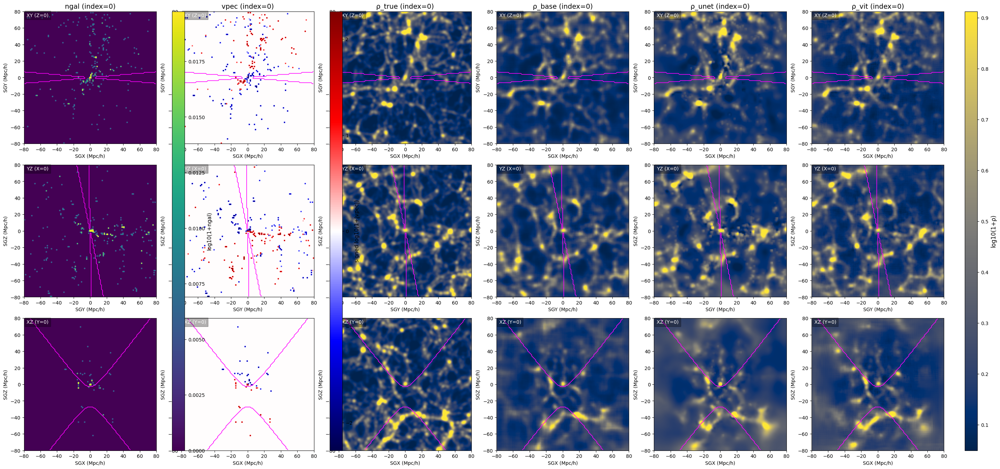

In [11]:
# -*- coding: utf-8 -*-
"""
3x6 figure:
[ngal | vpec | rho_true]  ||  [rho_base | rho_unet | rho_vit]
- 왼쪽 2열(ngal, vpec)만 개별 colorbar (이미지 크기 불변)
- density 계열 4패널은 공통 vmin/vmax + 우측 공통 colorbar (이미지 크기 불변)
- 각 패널 ZOA(|b|<5°) 경계 표시, 세 행은 XY/YZ/XZ 평면
"""

import os
import h5py
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from astropy.coordinates import SkyCoord, Supergalactic, CartesianRepresentation
import astropy.units as u
from matplotlib.transforms import Bbox

# ---------------- 사용자 설정 ----------------
index = 0
L = 160.0
thresh_deg = 5.0
DENSITY_CMAP = "cividis"    # density용
NGAL_CMAP    = "viridis"    # ngal용
VPEC_CMAP    = "seismic"    # vpec용 (부호 보존 diverging)
SLICE_MODE   = "slice"      # "slice" 또는 "proj"

# 경로
true_test_path = f"/gpfs/adupuy/cosmicweb_asim/ASIM_TSC/samples/test/{index}.hdf5"
base_path      = "/gpfs/adupuy/cosmicweb_asim/ASIM_TSC/samples/predictions/"
unet_pred_path = "/home/mingyeong/GAL2DM_ASIM_VNET/results/unet_predictions/28845/icase-both-keep2"
vit_pred_path  = "/home/mingyeong/GAL2DM_ASIM_ViT/results/vit_predictions/28846/icase-both"

# ---------------- 유틸 ----------------
def to_DHW(a):
    a = np.asarray(a)
    while a.ndim > 3 and a.shape[0] == 1: a = a[0]
    while a.ndim > 3 and a.shape[0] == 1: a = a[0]
    if a.ndim == 5: a = a[0,0]
    elif a.ndim == 4: a = a[0]
    if a.ndim != 3: raise ValueError(f"Unexpected shape {a.shape}")
    if a.shape[2] == max(a.shape) and a.shape[0] != max(a.shape):
        a = a.transpose(2,0,1)
    return a

def reduce2d(vol, plane, mode):
    D, H, W = vol.shape
    return {
        "xy": vol.mean(axis=0) if mode=="proj" else vol[D//2],
        "yz": vol.mean(axis=2) if mode=="proj" else vol[:, :, W//2],
        "xz": vol.mean(axis=1) if mode=="proj" else vol[:, H//2, :],
    }[plane]

def b_grid(N, L):
    axis = np.linspace(-L/2, L/2, N)
    sgz, sgy, sgx = np.meshgrid(axis, axis, axis, indexing='ij')  # (Z,Y,X)
    rep = CartesianRepresentation(sgx.ravel()*u.Mpc, sgy.ravel()*u.Mpc, sgz.ravel()*u.Mpc)
    b = SkyCoord(rep, frame=Supergalactic()).galactic.b.radian
    return b.reshape((N,N,N))

def load_pred_h5(path, dataset="prediction"):
    with h5py.File(path, "r") as f:
        arr = f[dataset][:]
    return to_DHW(arr)

def log10p(a):  # log10(1+a), a>=0 가정
    return np.log10(1.0 + np.clip(a, a_min=0, a_max=None))

def vpec_signedlog10(a):  # 부호 보존
    return np.sign(a) * np.log10(1.0 + np.abs(a))

# ---------------- 데이터 로드 ----------------
with h5py.File(true_test_path, "r") as f:
    x = normalize_input_2ch(f["input"][:])   # 외부 제공 함수: (2,D,H,W)
    ngal = to_DHW(x[0])
    vpec = to_DHW(x[1])
    rho_true = to_DHW(f["output_rho"][:])

idx_str = str(index)
rho_unet = load_pred_h5(os.path.join(unet_pred_path, f"{idx_str}.hdf5"))
rho_vit  = load_pred_h5(os.path.join(vit_pred_path,  f"{idx_str}.hdf5"))

base_npy = os.path.join(
    base_path, f"test_{idx_str}_final_mode0_lr_min1e-07_max1e-05_200epochs_rho_240712_a100_cmb_f2.5.npy"
)
if os.path.isfile(base_npy):
    rho_base = to_DHW(10**(2.5 * np.load(base_npy)))
else:
    rho_base = np.full_like(rho_true, np.nan)
    print(f"[WARN] base npy not found: {base_npy}")

# ---------------- 좌표/ZOA ----------------
N = rho_true.shape[0]
axis = np.linspace(-L/2, L/2, N)
B = b_grid(N, L)
ZOA = (np.abs(B) < np.radians(thresh_deg))

# ---------------- Density log 변환 + 공통 스케일 ----------------
rhoT = {
    "ρ_true": log10p(rho_true),
    "ρ_base": log10p(rho_base),
    "ρ_unet": log10p(rho_unet),
    "ρ_vit":  log10p(rho_vit),
}

planes = ["xy","yz","xz"]
stack = []
for vol in rhoT.values():
    for pl in planes:
        stack.append(reduce2d(vol, pl, SLICE_MODE).ravel())
vmin_rho, vmax_rho = np.nanpercentile(np.concatenate(stack), [1, 99])
print(f"[Density Scale] vmin={vmin_rho:.3f}, vmax={vmax_rho:.3f}")

# ---------------- 시각화 ----------------
plane_title = {"xy":"XY (Z=0)", "yz":"YZ (X=0)", "xz":"XZ (Y=0)"}
datasets_L = [("ngal", ngal), ("vpec", vpec), ("ρ_true", rhoT["ρ_true"])]
datasets_R = [("ρ_base", rhoT["ρ_base"]), ("ρ_unet", rhoT["ρ_unet"]), ("ρ_vit",  rhoT["ρ_vit"])]

# 레이아웃: 이미지 크기 고정 (colorbar는 별도 축에 그려서 영향 X)
fig, axes = plt.subplots(3, 6, figsize=(30, 14))
plt.subplots_adjust(left=0.05, right=0.93, top=0.96, bottom=0.06, wspace=0.18, hspace=0.16)
extent = [axis.min(), axis.max(), axis.min(), axis.max()]

last_im_ngal = None
last_im_vpec = None

# ---- 왼쪽 3열 (입력/진실) ----
for col, (name, vol) in enumerate(datasets_L):
    imgs = {}
    for pl in planes:
        img2d = reduce2d(vol, pl, SLICE_MODE)
        if name == "ngal":
            img2d = log10p(img2d)
        elif name == "vpec":
            img2d = vpec_signedlog10(img2d)
        imgs[pl] = img2d

    if name == "ngal":
        vals = np.concatenate([imgs[p].ravel() for p in planes])
        vmin, vmax = np.nanpercentile(vals, [0.1, 99.9])
        cmap_use = NGAL_CMAP
    elif name == "vpec":
        vals = np.concatenate([np.abs(imgs[p]).ravel() for p in planes])
        vmax_abs = np.nanpercentile(vals, 99.5)
        vmin, vmax = -vmax_abs, vmax_abs
        cmap_use = VPEC_CMAP
    else:  # ρ_true는 density 공통 스케일
        vmin, vmax = vmin_rho, vmax_rho
        cmap_use = DENSITY_CMAP

    for row, pl in enumerate(planes):
        ax = axes[row, col]
        im = ax.imshow(imgs[pl], origin='lower', cmap=cmap_use,
                       vmin=vmin, vmax=vmax, extent=extent)
        if name == "ngal": last_im_ngal = im
        if name == "vpec": last_im_vpec = im

        mask2d = ZOA[N//2] if pl=="xy" else (ZOA[:,:,N//2] if pl=="yz" else ZOA[:,N//2,:])
        ax.contour(mask2d.astype(float), levels=[0.5], colors="magenta",
                   linewidths=1.2, origin='lower', extent=extent)

        if row == 0:
            ax.set_title(f"{name} (index={index})", fontsize=14)

        if pl == "xy":
            ax.set_xlabel("SGX (Mpc/h)"); ax.set_ylabel("SGY (Mpc/h)")
        elif pl == "yz":
            ax.set_xlabel("SGY (Mpc/h)"); ax.set_ylabel("SGZ (Mpc/h)")
        else:
            ax.set_xlabel("SGX (Mpc/h)"); ax.set_ylabel("SGZ (Mpc/h)")

        ax.text(0.02, 0.96, plane_title[pl], transform=ax.transAxes,
                color="white", fontsize=10, bbox=dict(fc="black", alpha=0.3))

# ---- 오른쪽 3열 (ρ predictions with unified scale) ----
for j, (name, vol) in enumerate(datasets_R, start=3):
    for row, pl in enumerate(planes):
        ax = axes[row, j]
        img = reduce2d(vol, pl, SLICE_MODE)
        ax.imshow(img, origin='lower', cmap=DENSITY_CMAP,
                  vmin=vmin_rho, vmax=vmax_rho, extent=extent)

        mask2d = ZOA[N//2] if pl=="xy" else (ZOA[:,:,N//2] if pl=="yz" else ZOA[:,N//2,:])
        ax.contour(mask2d.astype(float), levels=[0.5], colors="magenta",
                   linewidths=1.2, origin='lower', extent=extent)

        if row == 0:
            ax.set_title(f"{name} (index={index})", fontsize=14)

        if pl == "xy":
            ax.set_xlabel("SGX (Mpc/h)"); ax.set_ylabel("SGY (Mpc/h)")
        elif pl == "yz":
            ax.set_xlabel("SGY (Mpc/h)"); ax.set_ylabel("SGZ (Mpc/h)")
        else:
            ax.set_xlabel("SGX (Mpc/h)"); ax.set_ylabel("SGZ (Mpc/h)")

        ax.text(0.02, 0.96, plane_title[pl], transform=ax.transAxes,
                color="white", fontsize=10, bbox=dict(fc="black", alpha=0.3))

# ---------------- 컬러바: 이미지 크기 유지 위해 '별도 축'에 배치 ----------------

def column_bbox(fig_axes_col):
    """한 열(또는 여러 열)의 axes position을 합쳐 bbox 반환"""
    boxes = [ax.get_position() for ax in fig_axes_col]
    return Bbox.from_extents(min(b.x0 for b in boxes),
                             min(b.y0 for b in boxes),
                             max(b.x1 for b in boxes),
                             max(b.y1 for b in boxes))

# (1) ngal 컬럼(열 0)
bbox_ng = column_bbox(axes[:, 0])
cax_ng = fig.add_axes([bbox_ng.x1 + 0.015, bbox_ng.y0, 0.012, bbox_ng.height])
cb_ng = plt.colorbar(last_im_ngal, cax=cax_ng)
cb_ng.set_label("log10(1+ngal)", fontsize=11)

# (2) vpec 컬럼(열 1)
bbox_vp = column_bbox(axes[:, 1])
cax_vp = fig.add_axes([bbox_vp.x1 + 0.015, bbox_vp.y0, 0.012, bbox_vp.height])
cb_vp = plt.colorbar(last_im_vpec, cax=cax_vp)
cb_vp.set_label("signed log10(1+|vpec|)", fontsize=11)

# (3) density 그룹(열 2–5) 공통 colorbar
bbox_den = column_bbox(axes[:, 2:].ravel().tolist())
cax_den = fig.add_axes([bbox_den.x1 + 0.020, bbox_den.y0, 0.012, bbox_den.height])
mappable_R = cm.ScalarMappable(cmap=DENSITY_CMAP, norm=plt.Normalize(vmin_rho, vmax_rho))
mappable_R.set_array([])
cb_den = plt.colorbar(mappable_R, cax=cax_den)
cb_den.set_label("log10(1+ρ)", fontsize=12)



plt.show()


[Density Scale] vmin=0.055, vmax=0.933


/tmp/ipykernel_1581085/737753411.py:136: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(right=0.86, wspace=0.15, hspace=0.15)


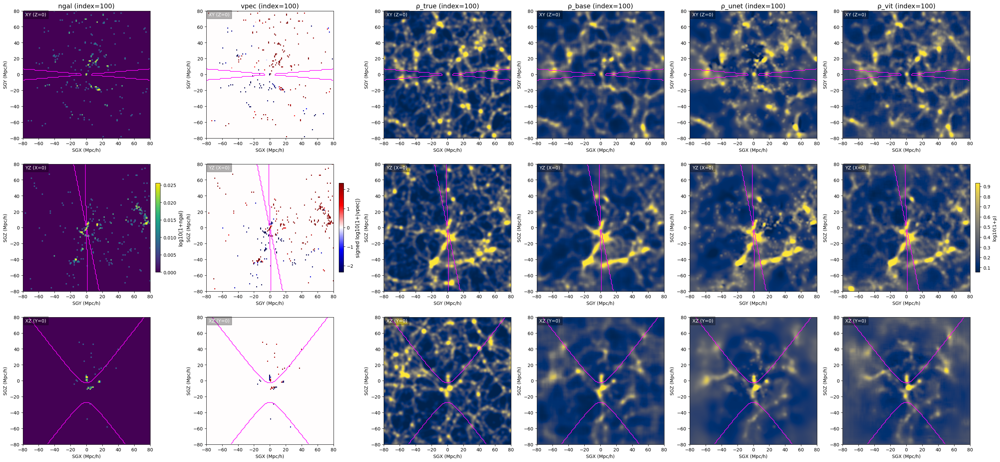

In [12]:
# -*- coding: utf-8 -*-
"""
3x6 figure:
[ngal | vpec | rho_true]  ||  [rho_base | rho_unet | rho_vit]
- 왼쪽 2열(ngal, vpec)만 개별 colorbar
- density 계열(ρ_true, ρ_base, ρ_unet, ρ_vit)은 공통 vmin/vmax + 오른쪽 공통 colorbar
- 각 패널 ZOA(|b|<5°) 경계 표시, 세 행은 XY/YZ/XZ 평면
"""

import os
import h5py
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from astropy.coordinates import SkyCoord, Supergalactic, CartesianRepresentation
import astropy.units as u

# ---------------- 사용자 설정 ----------------
index = 100  # int 또는 str 가능
L = 160.0
thresh_deg = 5.0
DENSITY_CMAP = "cividis"    # density용
NGAL_CMAP    = "viridis"    # ngal용
VPEC_CMAP    = "seismic"    # vpec용 (부호 보존 diverging)
SLICE_MODE   = "slice"      # "slice" 또는 "proj"

# 경로
true_test_path = f"/gpfs/adupuy/cosmicweb_asim/ASIM_TSC/samples/test/{index}.hdf5"
base_path      = "/gpfs/adupuy/cosmicweb_asim/ASIM_TSC/samples/predictions/"
unet_pred_path = "/home/mingyeong/GAL2DM_ASIM_VNET/results/unet_predictions/28845/icase-both-keep2"
vit_pred_path  = "/home/mingyeong/GAL2DM_ASIM_ViT/results/vit_predictions/28846/icase-both"

# ---------------- 유틸 ----------------
def to_DHW(a):
    a = np.asarray(a)
    while a.ndim > 3 and a.shape[0] == 1: a = a[0]
    while a.ndim > 3 and a.shape[0] == 1: a = a[0]
    if a.ndim == 5: a = a[0,0]
    elif a.ndim == 4: a = a[0]
    if a.ndim != 3:
        raise ValueError(f"Unexpected shape {a.shape}")
    if a.shape[2] == max(a.shape) and a.shape[0] != max(a.shape):
        a = a.transpose(2,0,1)
    return a

def reduce2d(vol, plane, mode):
    D, H, W = vol.shape
    return {
        "xy": vol.mean(axis=0) if mode=="proj" else vol[D//2],
        "yz": vol.mean(axis=2) if mode=="proj" else vol[:, :, W//2],
        "xz": vol.mean(axis=1) if mode=="proj" else vol[:, H//2, :],
    }[plane]

def b_grid(N, L):
    axis = np.linspace(-L/2, L/2, N)
    sgz, sgy, sgx = np.meshgrid(axis, axis, axis, indexing='ij')  # (Z,Y,X)
    rep = CartesianRepresentation(sgx.ravel()*u.Mpc,
                                  sgy.ravel()*u.Mpc,
                                  sgz.ravel()*u.Mpc)
    b = SkyCoord(rep, frame=Supergalactic()).galactic.b.radian
    return b.reshape((N,N,N))

def load_pred_h5(path, dataset="prediction"):
    with h5py.File(path, "r") as f:
        arr = f[dataset][:]
    return to_DHW(arr)

def log10p(a):
    """log10(1+a), a>=0 가정"""
    return np.log10(1.0 + np.clip(a, a_min=0, a_max=None))

def vpec_signedlog10(a):
    """부호 보존 signed log10(1+|vpec|)"""
    return np.sign(a) * np.log10(1.0 + np.abs(a))

# ---------------- 데이터 로드 ----------------
with h5py.File(true_test_path, "r") as f:
    x = normalize_input_2ch(f["input"][:])   # 외부 제공 함수: (2,D,H,W)
    ngal = to_DHW(x[0])
    vpec = to_DHW(x[1])
    rho_true = to_DHW(f["output_rho"][:])

# 예측 로드
idx_str = str(index)
unet_path = os.path.join(unet_pred_path, f"{idx_str}.hdf5")
vit_path  = os.path.join(vit_pred_path,  f"{idx_str}.hdf5")
rho_unet = load_pred_h5(unet_path)
rho_vit  = load_pred_h5(vit_path)

# base: log10(ρ)/2.5 라고 가정 → ρ 역변환
base_npy = os.path.join(
    base_path,
    f"test_{idx_str}_final_mode0_lr_min1e-07_max1e-05_200epochs_rho_240712_a100_cmb_f2.5.npy"
)
if os.path.isfile(base_npy):
    base_raw = np.load(base_npy)
    rho_base = 10**(2.5 * base_raw)
    rho_base = to_DHW(rho_base)
else:
    rho_base = np.full_like(rho_true, np.nan)
    print(f"[WARN] base npy not found: {base_npy}")

# ---------------- 좌표/ZOA ----------------
N = rho_true.shape[0]
axis = np.linspace(-L/2, L/2, N)
B = b_grid(N, L)
ZOA = (np.abs(B) < np.radians(thresh_deg))

# ---------------- Density log 변환 + 공통 스케일 ----------------
rhoT = {
    "ρ_true": log10p(rho_true),
    "ρ_base": log10p(rho_base),
    "ρ_unet": log10p(rho_unet),
    "ρ_vit":  log10p(rho_vit),
}

planes = ["xy","yz","xz"]

# density 전체(진실+예측, 3평면)로 하나의 vmin/vmax
stack = []
for vol in rhoT.values():
    for pl in planes:
        stack.append(reduce2d(vol, pl, SLICE_MODE).ravel())
vmin_rho, vmax_rho = np.nanpercentile(np.concatenate(stack), [1, 99])
print(f"[Density Scale] vmin={vmin_rho:.3f}, vmax={vmax_rho:.3f}")

# ---------------- 시각화 ----------------
plane_title = {"xy":"XY (Z=0)", "yz":"YZ (X=0)", "xz":"XZ (Y=0)"}
datasets_L = [("ngal", ngal), ("vpec", vpec), ("ρ_true", rhoT["ρ_true"])]
datasets_R = [("ρ_base", rhoT["ρ_base"]),
              ("ρ_unet", rhoT["ρ_unet"]),
              ("ρ_vit",  rhoT["ρ_vit"])]

# 겹침 방지를 위해 constrained_layout 사용 + 우측 colorbar 자리 확보
fig, axes = plt.subplots(3, 6, figsize=(30, 14), constrained_layout=True)
fig.subplots_adjust(right=0.86, wspace=0.15, hspace=0.15)
extent = [axis.min(), axis.max(), axis.min(), axis.max()]

# ---- 왼쪽 3열 (입력/진실) ----
for col, (name, vol) in enumerate(datasets_L):
    imgs = {}
    for pl in planes:
        img2d = reduce2d(vol, pl, SLICE_MODE)
        if name == "ngal":
            img2d = log10p(img2d)
        elif name == "vpec":
            img2d = vpec_signedlog10(img2d)
        imgs[pl] = img2d

    if name == "ngal":
        vals = np.concatenate([imgs[p].ravel() for p in planes])
        vmin, vmax = np.nanpercentile(vals, [0.1, 99.9])
        cmap_use = NGAL_CMAP
    elif name == "vpec":
        vals = np.concatenate([np.abs(imgs[p]).ravel() for p in planes])
        vmax_abs = np.nanpercentile(vals, 99.5)
        vmin, vmax = -vmax_abs, vmax_abs
        cmap_use = VPEC_CMAP
    else:  # ρ_true
        vmin, vmax = vmin_rho, vmax_rho
        cmap_use = DENSITY_CMAP

    last_im = None
    for row, pl in enumerate(planes):
        ax = axes[row, col]
        im = ax.imshow(imgs[pl], origin='lower', cmap=cmap_use,
                       vmin=vmin, vmax=vmax, extent=extent)
        last_im = im

        # ZOA 경계선
        if pl=="xy": mask2d = ZOA[N//2]
        elif pl=="yz": mask2d = ZOA[:, :, N//2]
        else: mask2d = ZOA[:, N//2, :]
        ax.contour(mask2d.astype(float), levels=[0.5], colors="magenta",
                   linewidths=1.2, origin='lower', extent=extent)

        if row == 0:
            ax.set_title(f"{name} (index={index})", fontsize=14)

        if pl == "xy":
            ax.set_xlabel("SGX (Mpc/h)"); ax.set_ylabel("SGY (Mpc/h)")
        elif pl == "yz":
            ax.set_xlabel("SGY (Mpc/h)"); ax.set_ylabel("SGZ (Mpc/h)")
        else:
            ax.set_xlabel("SGX (Mpc/h)"); ax.set_ylabel("SGZ (Mpc/h)")

        ax.text(0.02, 0.96, plane_title[pl], transform=ax.transAxes,
                color="white", fontsize=10, bbox=dict(fc="black", alpha=0.3))

    # 왼쪽 2열만 개별 colorbar
    if col in (0, 1):
        cbar = fig.colorbar(last_im, ax=axes[:, col].ravel().tolist(),
                            fraction=0.035, pad=0.02, use_gridspec=True)
        label = "log10(1+ngal)" if col == 0 else "signed log10(1+|vpec|)"
        cbar.set_label(label, fontsize=11)

# ---- 오른쪽 3열 (ρ predictions with unified scale) ----
for j, (name, vol) in enumerate(datasets_R, start=3):
    for row, pl in enumerate(planes):
        ax = axes[row, j]
        img = reduce2d(vol, pl, SLICE_MODE)
        im = ax.imshow(img, origin='lower', cmap=DENSITY_CMAP,
                       vmin=vmin_rho, vmax=vmax_rho, extent=extent)
        last_im = im

        # ZOA 경계
        if pl=="xy": mask2d = ZOA[N//2]
        elif pl=="yz": mask2d = ZOA[:, :, N//2]
        else: mask2d = ZOA[:, N//2, :]
        ax.contour(mask2d.astype(float), levels=[0.5], colors="magenta",
                   linewidths=1.2, origin='lower', extent=extent)

        if row == 0:
            ax.set_title(f"{name} (index={index})", fontsize=14)

        if pl == "xy":
            ax.set_xlabel("SGX (Mpc/h)"); ax.set_ylabel("SGY (Mpc/h)")
        elif pl == "yz":
            ax.set_xlabel("SGY (Mpc/h)"); ax.set_ylabel("SGZ (Mpc/h)")
        else:
            ax.set_xlabel("SGX (Mpc/h)"); ax.set_ylabel("SGZ (Mpc/h)")

        ax.text(0.02, 0.96, plane_title[pl], transform=ax.transAxes,
                color="white", fontsize=10, bbox=dict(fc="black", alpha=0.3))

# ✅ 오른쪽 공통 컬러바: 마지막 열(컬럼 5)에만 붙여 높이를 동일화
#    (왼쪽 1,2번 컬러바와 동일한 '세 줄 높이의 한 컬럼' 기준)
cbar = fig.colorbar(
    last_im,
    ax=axes[:, 5].ravel().tolist(),   # ⬅️ 바뀐 부분: 2:]-> 5열만
    fraction=0.035,
    pad=0.02,
    use_gridspec=True
)
cbar.set_label("log10(1+ρ)")

plt.show()
